# Auto Regressive Time Series Model Reanaysis on Wheat Price

In this notebook, we try to build a AR time series model to predict the wheat price use JRA-55, particular incorporate with *Multivariate ENSO Index (MEI)* factor.

**Data Dictionary**
- **JRA55**:

    The JRA-55 dataset is a comprehensive global atomospheric reanalysis product developed by the Japan Meteorological Agency (JMA). It covers 60-year period from 1958 to the present and provides high-quality gridded data of various atmosphere parameters.

    - Arctic Oscillation (AO): A climate pattern charaterized by pressure differences between the Arctic and mid-latittudes. It affects weather in the Northern Hemisphere, particularly in Europe and North American.
        - The AO is a climate pattern characterized by winds circulating counterclockwise around the Arctic at around 55°N latitude.
        - When the AO is in its positive phase, a ring of strong winds circulating around the North Pole acts to confine colder air across polar regions. 
        - This belt of winds becomes weaker and more distorted in the negative phase of the AO, which allows an easier southward penetration of colder, arctic airmasses and increased storminess into the mid-latitudes.
        - https://www.ncei.noaa.gov/access/monitoring/ao/
    
    - Multivariate ENSO (El Niño Southern Oscillation) Index (MEI): An index that captures the complex, multi-dimensional nature of ENSO, a climate pattern that occurs in the tropical Pacific Ocean and influences global weather patterns.
        - https://en.wikipedia.org/wiki/Multivariate_ENSO_index
    
    - Pacific South American (PSA): A climate pattern related to atomospheric circulation anomalies in the Southern Hemisphere and influences South American weather.
        - https://www.nature.com/articles/s43247-021-00295-4
        
    - Pacific North American (PNA): A climate pattern that affects weather in North America and the North Pacific Ocean, linked to changes in the atmospheric circulation over these regions.
        - https://en.wikipedia.org/wiki/Pacific%E2%80%93North_American_teleconnection_pattern
    - Northern Hemisphere related teleconnections (NHTELE):A collection of atmospheric patterns that influence climate variability in the Northern Hemisphere.
    - Indian Ocean Dipole (IOD): A climate phenomenon that influences weather and climate variability in the Indian Ocean region, particularly affecting countries like India, Australia, and Indonesia.
        - https://en.wikipedia.org/wiki/Indian_Ocean_Dipole
    - Southern Annual Model (SAM):A climate pattern that represents the north-south movement of the westerly wind belt in the Southern Hemisphere, influencing weather in regions like Australia and Antarctica.
- **Wheat price (world bank)**: Monthly prices for various commdities

**Summary Table**
| Phenomenon | Description | JRA-55 Relevance |
| --- | --- | --- |
| Arctic Oscillation |Pressure differences in Arctic & mid-latitudes | Used to study AO's impact on weather & climate |
| Multivariate ENSO | Multi-dimensional index for ENSO | Used to analyze ENSO's impact on global climate
| Pacific South American | Atmospheric circulation anomalies in Southern Hemisphere | Used to study PSA's influence on South American weather |
| Pacific North American | Atmospheric circulation anomalies in North America & North Pacific | Used to examine PNA's impact on weather in affected regions
| Northern Hemisphere Teleconnections | Collection of atmospheric patterns in the Northern Hemisphere | Used to investigate climate variability in the Northern Hemisphere |
| Indian Ocean Dipole | Difference in sea surface temperatures in the Indian Ocean | Used to analyze IOD's influence on regional weather and climate variability |
| Southern Annual Mode | North-south movement of westerly wind belt in Southern Hemisphere | Used to study SAM's impact on weather in regions like Australia & Antarctica |

In future, this model should capable to expand with extend features and data input such as **NNR1** dataset.

<!-- Author Sunchuangyu Huang 1118472 -->

---

El Niño and La Niño are the two opposite phases of the El Niño-Southern Osciilation (ENSO) climate cycle, which is a naturally occuring phenomenon that involves fluctuation in sea surface temperatures (SSTs) and atmosphereic pressure in the equatorial Pacific Ocean. These phases have significant impacts on global weather and climate patterns.

| La Niña | El Niño |
|---------|---------|
| Cool phase of ENSO | Warm phase of ENSO |
| Surface waters in the eastern and central tropical Pacific Ocean are cooler than average | Surface waters in the eastern and central tropical Pacific Ocean are warmer than average |
| Trade winds are stronger than average | Trade winds are weaker than average |
| Upwelling of cold, nutrient-rich water occurs along the western coast of South America, leading to increased marine productivity | Reduced upwelling of cold, nutrient-rich water leads to decreased marine productivity |
| Weather patterns tend to be cooler and wetter than average in the southern US and warmer and drier than average in the western Pacific | Weather patterns tend


<img src="https://www.e-education.psu.edu/meteo469/sites/www.e-education.psu.edu.meteo469/files/lesson03/ENSOSchematicDP_.jpg" width=500 align=center />

Reading: El Niño and La Niña: Frequently asked questions: https://www.climate.gov/news-features/understanding-climate/el-niño-and-la-niña-frequently-asked-questions.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# import libraries
import os

import random
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

import statsmodels.api as sm 
from statsmodels.tsa.statespace.sarimax import SARIMAX

from scipy.stats import probplot

from pmdarima import auto_arima

import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import plotly.graph_objects as go
import plotly.io as pio
import plotly.subplots as sp
import seaborn as sns
import hvplot.pandas

# if running on m2 device with no figure produced, change the pio render to iframe
# pio.renderers.default = 'iframe'
%matplotlib inline

import sqlite3

from typing import Union, TypedDict, Tuple, List

RANDOM_SEED = 42
db = sqlite3.connect('../data/database.db')

# define datatypes
TIME_SERIES = Union[pd.Series, np.array]
SERIES = np.array
BOOLEAN = bool
DATAFRAME = pd.DataFrame

## Obtain JRA55 Reanalysis Data

**What is JRA55 Dataset (ChatGPT):**

The JRA-55 (Japanese 55-year Reanalysis) dataset is a comprehensive atmospheric reanalysis project conducted by the Japan Meteorological Agency (JMA). Reanalysis datasets combine observational data with numerical weather prediction models to create a consistent, long-term, and gridded dataset of various atmospheric variables. Such datasets are valuable for studying climate variability and change, as well as for initializing weather and climate models.

JRA-55, which covers the period from 1958 to the present, represents the second generation of JMA's reanalysis efforts, following the JRA-25 project. JRA-55 improves upon its predecessor by using a more advanced data assimilation system, higher model resolution, and an expanded set of input observations, including satellite data. As a result, JRA-55 provides a more accurate representation of the global atmosphere, especially in regions with sparse observational data.

The JRA-55 dataset includes numerous atmospheric variables, such as temperature, precipitation, wind, humidity, and pressure, at various vertical levels and horizontal resolutions. It also provides derived variables, like potential vorticity and geopotential height, which are useful for advanced meteorological and climatological studies. Researchers and practitioners in fields like meteorology, climatology, and hydrology can use the JRA-55 dataset to investigate a wide range of topics, including climate variability, extreme weather events, and the impacts of climate change on various sectors.

In [3]:
# load required data
jra55_sql_query = """
SELECT strftime('%Y-%m', date) as date, mei, ao_index, iod_index, nhtele_index_1, nhtele_index_2, nhtele_index_3, nhtele_index_4, pna_index, psa_index_1, psa_index_2, sam_index
FROM jra55
"""

jra55_df = pd.read_sql_query(sql=jra55_sql_query, con=db)
jra55_df.tail() # check 

,date,mei,ao_index,iod_index,nhtele_index_1,nhtele_index_2,nhtele_index_3,nhtele_index_4,pna_index,psa_index_1,psa_index_2,sam_index
727,2018-08,0.144861,0.456123,1.137964,-0.450036,1.078885,-2.233051,0.974322,-0.740481,0.364539,1.113363,-0.322401
728,2018-09,0.364861,0.836261,1.770952,-1.510670,1.832556,-1.370552,0.675671,-1.584611,-0.300852,0.352816,1.028305
729,2018-10,0.213739,-0.008267,1.530476,-1.769725,1.733359,0.070712,-0.614056,0.166716,0.336696,-0.786435,-0.117035
730,2018-11,0.109718,-0.294356,2.091921,0.765005,0.129299,-2.338415,1.793471,-0.230264,0.000805,-0.200025,0.892080
731,2018-12,-0.066669,-0.305253,1.968903,0.326827,-0.308922,0.256875,-0.327921,0.467829,-0.063912,-0.128670,0.623874


In [4]:
# check dataframe structure and missing value
display(jra55_df.info())
display(jra55_df.describe())
display(jra55_df.isnull().sum()) # no missing value found

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 732 entries, 0 to 731
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date            732 non-null    object 
 1   mei             732 non-null    float64
 2   ao_index        732 non-null    float64
 3   iod_index       732 non-null    float64
 4   nhtele_index_1  732 non-null    float64
 5   nhtele_index_2  732 non-null    float64
 6   nhtele_index_3  732 non-null    float64
 7   nhtele_index_4  732 non-null    float64
 8   pna_index       732 non-null    float64
 9   psa_index_1     732 non-null    float64
 10  psa_index_2     732 non-null    float64
 11  sam_index       732 non-null    float64
dtypes: float64(11), object(1)
memory usage: 68.8+ KB


None

,mei,ao_index,iod_index,nhtele_index_1,nhtele_index_2,nhtele_index_3,nhtele_index_4,pna_index,psa_index_1,psa_index_2,sam_index
count,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000
mean,-0.207786,-0.027761,0.004905,0.139885,-0.033448,-0.224226,0.109676,-0.154712,0.019999,0.033926,-0.114527
std,0.885097,1.007227,1.201823,1.106698,1.009969,1.081148,1.037411,0.981117,0.492383,0.492006,0.983144
min,-2.385977,-3.912790,-3.183678,-3.137356,-3.091565,-4.113282,-2.783767,-4.060131,-1.641667,-1.365044,-3.570385
25%,-0.843877,-0.634766,-0.802906,-0.656967,-0.768968,-0.942288,-0.625717,-0.653966,-0.289521,-0.321866,-0.735196
50%,-0.263419,0.025389,-0.052000,0.055322,-0.021773,-0.186107,0.045474,-0.135457,0.026959,0.004105,-0.076533
75%,0.293921,0.565064,0.769314,0.810596,0.607711,0.470751,0.781707,0.405928,0.347570,0.365875,0.565767
max,2.560082,3.508066,3.592926,4.086068,3.680278,2.917646,3.587093,3.334524,1.515243,1.497281,2.669866


date              0
mei               0
ao_index          0
iod_index         0
nhtele_index_1    0
nhtele_index_2    0
nhtele_index_3    0
nhtele_index_4    0
pna_index         0
psa_index_1       0
psa_index_2       0
sam_index         0
dtype: int64

In [5]:
jra55_df.hvplot.box()

:BoxWhisker   [Variable]   (value)

From the box plots, we notice there are a lots of outliers, particularly for factor ao, iod and pna index.
This might results by seasonal fluctuation or oscilliation, global warming and other factors.

A large MEI index indicates that the ENSO conditions are strong, and the temperature and pressure anomalies in the tropical Pacific Ocean are more significant than usual. Specifically, a positive MEI index value indicates the presence of El Niño conditions, while a negative MEI index value indicates the presence of La Niña conditions.

In [6]:
# plot mei trends
jra55_figs = dict()

for col in jra55_df.columns[1:]:
    
    jra55_figs[col] = go.Figure()
    jra55_figs[col].add_trace(go.Scatter(x=jra55_df['date'], y=jra55_df[col], mode="lines+markers", name=col))

    jra55_figs[col].update_layout(yaxis=dict(title=f'{col}'),
                                  title=f'JRA55: {col.upper()}, From {jra55_df.iloc[0][0]} - {jra55_df.iloc[-1][0]}')

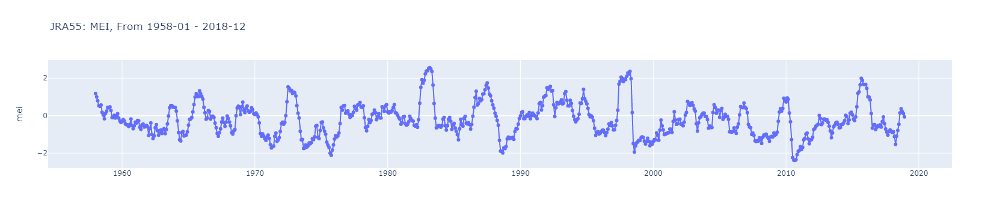

In [7]:
jra55_figs['mei']

Upon examining the graph, we observe a prominent cyclical pattern in the MEI factor, which corresponds to the recurring ENSO cycle that occurs every 3 to 7 years. As a result, we anticipate that this periodic pattern will produce discernible impacts on the log returns of wheat prices.

## Obtain Wheat Data From WorldBank Commodity-Markets Dataset

The World Bank Commodity Markets Data is a collection of datasets that provide historical and current information on the prices of various commodities. These datasets cover a wide range of products, including energy sources (e.g., crude oil, natural gas, and coal), metals (e.g., aluminum, copper, and gold), and agricultural commodities (e.g., wheat, rice, and corn). The data is used by researchers, policymakers, and market participants to analyze trends, assess the impact of various economic policies, and make informed decisions related to commodity investments or trade.

The World Bank updates these datasets periodically to reflect the most recent price data and market developments. The data is collected from various sources, including global exchanges, market reports, and direct price observations. The datasets typically include information on prices (both nominal and real), indices, and price forecasts.

In [8]:
# obtain wheat data
wb_sql_query = """
SELECT strftime('%Y-%m', MONTH) as date, 
    "Wheat, US SRW ($/mt) WHEAT_US_SRW" AS "WHEAT_US_SRW", 
    "Wheat, US HRW ($/mt) WHEAT_US_HRW" AS "WHEAT_US_HRW", 
    "Wheat, Canadian ($/mt) WHEAT_CANADI" AS "WHEAT_CANADI"
FROM cmo_historical_data_monthly
"""

wb_wheat = pd.read_sql_query(sql=wb_sql_query, con=db)
wb_wheat = wb_wheat.dropna(subset=['date'])

In [13]:
# obtain wheat data
wb_sql_query = """
SELECT strftime('%Y-%m-%d', MONTH) as date, 
    "Wheat, US SRW ($/mt) WHEAT_US_SRW" AS "WHEAT_US_SRW", 
    "Maize ($/mt) MAIZE" AS "MAIZE",
    "Rice, Thai 5%  ($/mt) RICE_05",
    ""
    ""
    *
FROM cmo_historical_data_monthly
"""

crop_df = pd.read_sql_query(sql=wb_sql_query, con=db)
crop_df = crop_df.dropna(subset=['date'])

In [15]:
crop_df.columns

Index(['date', 'WHEAT_US_SRW', 'MONTH',
       'Crude oil, average ($/bbl) CRUDE_PETRO',
       'Crude oil, Brent ($/bbl) CRUDE_BRENT',
       'Crude oil, Dubai ($/bbl) CRUDE_DUBAI',
       'Crude oil, WTI ($/bbl) CRUDE_WTI', 'Coal, Australian ($/mt) COAL_AUS',
       'Coal, South African ($/mt) COAL_SAFRICA',
       'Natural gas, US ($/mmbtu) NGAS_US',
       'Natural gas, Europe ($/mmbtu) NGAS_EUR',
       'Liquefied natural gas, Japan ($/mmbtu) NGAS_JP',
       'Natural gas index (2010=100) iNATGAS', 'Cocoa ($/kg) COCOA',
       'Coffee, Arabica ($/kg) COFFEE_ARABIC',
       'Coffee, Robusta ($/kg) COFFEE_ROBUS',
       'Tea, avg 3 auctions ($/kg) TEA_AVG', 'Tea, Colombo ($/kg) TEA_COLOMBO',
       'Tea, Kolkata ($/kg) TEA_KOLKATA', 'Tea, Mombasa ($/kg) TEA_MOMBASA',
       'Coconut oil ($/mt) COCONUT_OIL', 'Groundnuts ($/mt) GRNUT',
       'Fish meal ($/mt) FISH_MEAL', 'Groundnut oil ($/mt) GRNUT_OIL',
       'Palm oil ($/mt) PALM_OIL', 'Palm kernel oil ($/mt) PLMKRNL_OIL',
       

In [9]:
# calculate the log return for time series analysis
def log_returns(prices: TIME_SERIES) -> SERIES:
    """
    Calculate log returns of a time series of prices.

    Args:
        prices (array-like): A time series of prices, such as stock prices or currency exchange rates.

    Returns:
        np.ndarray: An array of log returns.
    """
    prices_shifted = np.roll(prices, 1)
    log_returns = np.log(prices / prices_shifted)
    log_returns[0] = np.nan  # Set the first value to NaN, as there's no previous price to calculate the return

    return log_returns

In [324]:
# calculate the log return
wb_wheat['log_SRW'] = log_returns(wb_wheat.WHEAT_US_SRW)
wb_wheat['log_HRW'] = log_returns(wb_wheat.WHEAT_US_HRW)
wb_wheat['log_CANADI'] = log_returns(wb_wheat.WHEAT_CANADI)

In [325]:
# calculate the cumulative log return
wb_wheat['cum_log_SRW'] = wb_wheat.log_SRW.cumsum()
wb_wheat['cum_log_HRW'] = wb_wheat.log_HRW.cumsum()
wb_wheat['cum_log_CANADI'] = wb_wheat.log_CANADI.cumsum()

In [326]:
wb_wheat

,date,WHEAT_US_SRW,WHEAT_US_HRW,WHEAT_CANADI,log_SRW,log_HRW,log_CANADI,cum_log_SRW,cum_log_HRW,cum_log_CANADI
0,1960-01,NaN,59.87500,64.00000,NaN,NaN,NaN,NaN,NaN,NaN
1,1960-02,NaN,61.00000,64.06250,NaN,0.018615,0.000976,NaN,0.018615,0.000976
2,1960-03,NaN,61.71875,63.75000,NaN,0.011714,-0.004890,NaN,0.030329,-0.003914
3,1960-04,NaN,61.00000,63.34375,NaN,-0.011714,-0.006393,NaN,0.018615,-0.010307
4,1960-05,NaN,57.68750,63.12500,NaN,-0.055833,-0.003459,NaN,-0.037219,-0.013766
...,...,...,...,...,...,...,...,...,...,...
717,2019-10,212.875,199.50000,NaN,0.053056,0.050766,NaN,0.416388,1.203555,NaN
718,2019-11,223.500,203.25000,NaN,0.048706,0.018623,NaN,0.465094,1.222178,NaN
719,2019-12,237.625,210.87500,NaN,0.061282,0.036829,NaN,0.526376,1.259006,NaN
720,2020-01,248.000,224.50000,NaN,0.042735,0.062610,NaN,0.569111,1.321617,NaN


In [327]:
# check dataframe structure and missing value
display(wb_wheat.info())
display(wb_wheat.describe())
display(wb_wheat.isnull().sum()) 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 722 entries, 0 to 721
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date            722 non-null    object 
 1   WHEAT_US_SRW    494 non-null    float64
 2   WHEAT_US_HRW    722 non-null    float64
 3   WHEAT_CANADI    627 non-null    float64
 4   log_SRW         493 non-null    float64
 5   log_HRW         721 non-null    float64
 6   log_CANADI      626 non-null    float64
 7   cum_log_SRW     493 non-null    float64
 8   cum_log_HRW     721 non-null    float64
 9   cum_log_CANADI  626 non-null    float64
dtypes: float64(9), object(1)
memory usage: 78.2+ KB


None

,WHEAT_US_SRW,WHEAT_US_HRW,WHEAT_CANADI,log_SRW,log_HRW,log_CANADI,cum_log_SRW,cum_log_HRW,cum_log_CANADI
count,494.000000,722.000000,627.000000,493.000000,721.000000,626.000000,493.000000,721.000000,626.000000
mean,167.373988,150.753895,165.868571,0.001079,0.001775,0.002815,0.125866,0.809947,0.819641
std,57.117642,71.388969,89.268912,0.064642,0.056528,0.051346,0.309086,0.491688,0.525817
min,85.312500,52.187500,61.187500,-0.259864,-0.219028,-0.184360,-0.497996,-0.137416,-0.044940
25%,129.875000,106.656250,98.500000,-0.033394,-0.025230,-0.017503,-0.077745,0.579985,0.433075
50%,152.375000,148.250000,165.750000,0.000706,0.000000,0.000000,0.082027,0.907484,0.951598
75%,191.937500,179.968750,194.375000,0.035585,0.025391,0.021937,0.313178,1.100698,1.111228
max,419.500000,439.750000,732.500000,0.258193,0.518430,0.377752,1.094746,1.993947,2.437580


date                0
WHEAT_US_SRW      228
WHEAT_US_HRW        0
WHEAT_CANADI       95
log_SRW           229
log_HRW             1
log_CANADI         96
cum_log_SRW       229
cum_log_HRW         1
cum_log_CANADI     96
dtype: int64

According to:
- "Hard Red Winter Wheat" by the Wheat Foods Council: https://www.wheatfoods.org/wp-content/uploads/2017/08/Hard-Red-Winter-Wheat.pdf
- "Soft Red Winter Wheat" by the University of Kentucky College of Agriculture, Food and Environment: https://www.uky.edu/Ag/GrainCrops/ID125.pdf
- "Wheat: Types and Uses" by the Grain Chain: https://grainchain.com/topics/wheat-types-and-uses
- "Canada Western Red Spring Wheat: Quality Characteristics and Milling Performance" by the Canadian Grain Commission: https://www.grainscanada.gc.ca/wheat-ble/cwrsw-bcgmv-eng.htm
- "The Canadian Wheat Story" by the Canadian International Grains Institute: https://www.cigi.ca/the-canadian-wheat-story/

WHEAT_US_SRW, WHEAT_US_HRW, and WHEAT_CANADI stands for three different wheat types, that:
- **WHEAT_US_SRW** stands for Soft Red Winter Wheat, which is a type of wheat that is primarily grown in the southeastern and eastern United States. This wheat variety is typically used for producing cakes, pastries, and flatbreads.
- **WHEAT_US_HRW** stands for Hard Red Winter Wheat, which is a type of wheat that is mainly grown in the Great Plains region of the United States. This wheat variety is generally used for producing bread, due to its high gluten content.
- **WHEAT_CANADI** WHEAT_CANADI in the World Bank dataset likely refers to the Canadian wheat production, prices, or trade data. 

In [328]:
wb_wheat.hvplot.box()

:BoxWhisker   [Variable]   (value)

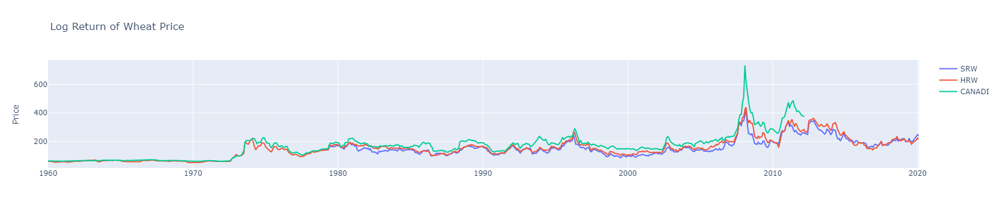

In [329]:
# plot the wheat price
wb_price_fig = go.Figure()

wb_price_fig.add_trace(go.Scatter(x=wb_wheat.date, y=wb_wheat.WHEAT_US_SRW, name='SRW'))
wb_price_fig.add_trace(go.Scatter(x=wb_wheat.date, y=wb_wheat.WHEAT_US_HRW, name='HRW'))
wb_price_fig.add_trace(go.Scatter(x=wb_wheat.date, y=wb_wheat.WHEAT_CANADI, name='CANADI'))

wb_price_fig.update_layout(yaxis=dict(title='Price'), title=" Log Return of Wheat Price")

wb_price_fig.show()

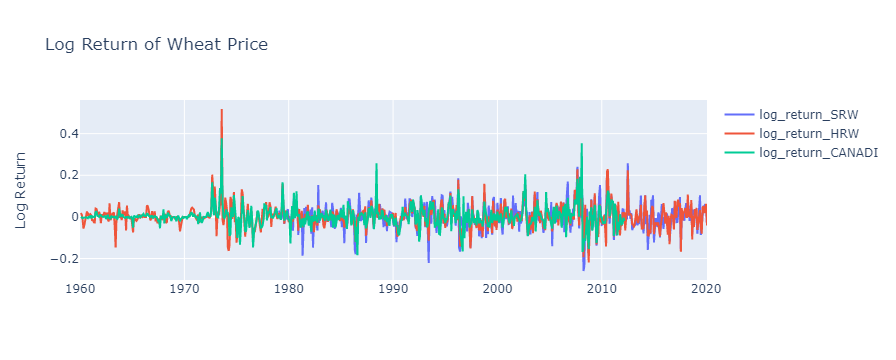

In [330]:
# plot the log return of wheat price
wb_log_return_fig = go.Figure()

wb_log_return_fig.add_trace(go.Scatter(x=wb_wheat.date, y=wb_wheat.log_SRW, name='log_return_SRW'))
wb_log_return_fig.add_trace(go.Scatter(x=wb_wheat.date, y=wb_wheat.log_HRW, name='log_return_HRW'))
wb_log_return_fig.add_trace(go.Scatter(x=wb_wheat.date, y=wb_wheat.log_CANADI, name='log_return_CANADI'))

wb_log_return_fig.update_layout(yaxis=dict(title='Log Return'), title=" Log Return of Wheat Price")

wb_log_return_fig.show()

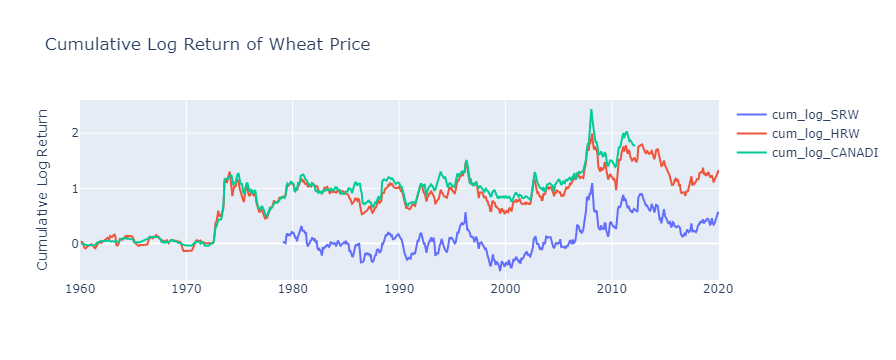

In [28]:
# plot the cumulative log return of wheat price
wb_cum_log_return_fig = go.Figure()

wb_cum_log_return_fig.add_trace(go.Scatter(x=wb_wheat.date, y=wb_wheat.cum_log_SRW, name='cum_log_SRW'))
wb_cum_log_return_fig.add_trace(go.Scatter(x=wb_wheat.date, y=wb_wheat.cum_log_HRW, name='cum_log_HRW'))
wb_cum_log_return_fig.add_trace(go.Scatter(x=wb_wheat.date, y=wb_wheat.cum_log_CANADI, name='cum_log_CANADI'))

wb_cum_log_return_fig.update_layout(yaxis=dict(title='Cumulative Log Return'), title="Cumulative Log Return of Wheat Price")

wb_cum_log_return_fig.show()

The boxplot reveals that `WHEAT_CANADI` exhibits a greater number of extreme values, which are more widely dispersed compared to those of `WHEAT_US_SRW` and `WHEAT_US_HRW`. This disparity is likely attributable to the financial crisis and recession that occurred between 2008 and 2010. It is evident that there are pronounced spikes around 2008.

The change of log return is relatively stable (shown in log return of wheat price), although during 1970 there is a significant increase. From the cumulative log return plot, it tells that all wheat price has a tendency of increasing price.

# Fill the NaN price via Interpolation

In `wb_wheat` data frame, there are many nan values for wheat price. To fill nan value, we try to use interpolation method.

There are several methods to handle nan value:

| Method          | Advantages                                                | Disadvantages                                         |
|-----------------|-----------------------------------------------------------|-------------------------------------------------------|
| Interpolation   | Simple, works with linear data, considers both neighbors | Not suitable for non-linear data, sudden price change |
| Backward fill   | Useful with future-related values, next value as a proxy | Not suitable when previous values are more relevant   |
| Forward fill    | Useful with past-related values, previous value as a proxy| Not suitable when next values are more relevant       |
| Average method  | Simple, works with random missing values                 | Not suitable for data with strong trend or seasonality|

Interpolation means determining a value from the existing values in a given data set. Another way of describing it is the act of inserting or interjecting an intermediate value between two other values.

Although interpolation is not suitable for data has a spike (e.g. in 2008 - 2010 financial crisis). During that time, price of wheat may have a non-linear dependencies such as inflation rate etc. 
In constrast, from the fig above, before year 2008, the economic state looks stable. It's reasonable to fill nan before 2008.

In [331]:
wb_wheat['WHEAT_CANADI'] = wb_wheat['WHEAT_CANADI'].interpolate(method='linear', order=2)

In [332]:
wb_wheat['WHEAT_US_HRW'] = wb_wheat['WHEAT_US_HRW'].interpolate(method='linear', order=2)

In [333]:
wb_wheat['WHEAT_US_SRW'] = (wb_wheat[['date', 'WHEAT_US_SRW']]
                                .sort_values(by='date', ascending=False).interpolate(method='linear')
                                .sort_values(by='date', ascending=True)['WHEAT_US_SRW'])

In [334]:
wb_wheat.isna().sum()

date                0
WHEAT_US_SRW        0
WHEAT_US_HRW        0
WHEAT_CANADI        0
log_SRW           229
log_HRW             1
log_CANADI         96
cum_log_SRW       229
cum_log_HRW         1
cum_log_CANADI     96
dtype: int64

NOTE: when infer the `WHEAT_US_SRW`, it requires the previous data point, e.g. fill missing value based on data from year 1960-01-01. However, it doesn't have this value. Therefore, we reverse the `WHEAT_US_SRW` to interpolate the data, then reserve again as a result list.

After fill missing value, we should have a plot like this:

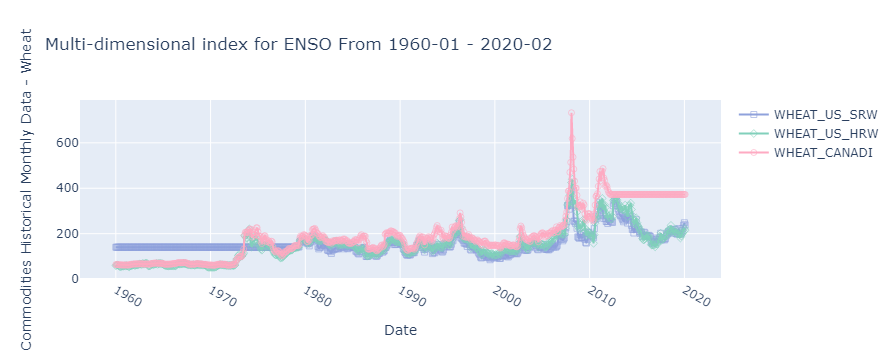

In [335]:
# plot the price trend
wb_wheat_fig1 = go.Figure()

wb_wheat_fig1.add_trace(go.Scatter(x=wb_wheat['date'], y=wb_wheat['WHEAT_US_SRW'], 
                                  mode="lines+markers", name='WHEAT_US_SRW',
                                  marker=dict(opacity=0.6, symbol='square-open', color='#8FA2DC')))
wb_wheat_fig1.add_trace(go.Scatter(x=wb_wheat['date'], y=wb_wheat['WHEAT_US_HRW'], 
                                  mode="lines+markers", name='WHEAT_US_HRW',
                                  marker=dict(opacity=0.6, symbol='diamond-open', color='#81D0BB')))
wb_wheat_fig1.add_trace(go.Scatter(x=wb_wheat['date'], y=wb_wheat['WHEAT_CANADI'], 
                                  mode="lines+markers", name='WHEAT_CANADI',
                                  marker=dict(opacity=0.6, symbol='circle-open', color='#FEAAC2')))

wb_wheat_fig1.update_layout(xaxis=dict(title='Date', tickangle=30),
                           yaxis=dict(title='Commodities Historical Monthly Data - Wheat'),
                      title=f'Multi-dimensional index for ENSO From {wb_wheat.iloc[0][0]} - {wb_wheat.iloc[-1][0]}')


wb_wheat_fig1.show()

Based on the graph, we find that:
- For WHEAT_US_SRW, it doesn't fit well after 1979 Feb 01, interpolation returns a constant 140.375.
- For WHEAT_CANADI, it doesn't fit well after 2012 May 01, interpolation returns a constant 372.75.

Interpolation doesn't provide better inference for price. Therefore, for better model accuracy, we select the data from date range (1979-01-01, 2012-03-01) for ARIMA training.

## Relation Exploration

In [336]:
# merge the dataframe
dataset = pd.merge(wb_wheat, jra55_df, on='date') 
dataset['date'] = pd.to_datetime(dataset['date'], format='%Y-%m-%d')
dataset.set_index('date', inplace=True)
dataset.tail()

,WHEAT_US_SRW,WHEAT_US_HRW,WHEAT_CANADI,log_SRW,log_HRW,log_CANADI,cum_log_SRW,cum_log_HRW,cum_log_CANADI,mei,ao_index,iod_index,nhtele_index_1,nhtele_index_2,nhtele_index_3,nhtele_index_4,pna_index,psa_index_1,psa_index_2,sam_index
date,,,,,,,,,,,,,,,,,,,,
2018-08-01,217.500,236.625,372.75,0.050084,0.080835,NaN,0.437881,1.374218,NaN,0.144861,0.456123,1.137964,-0.450036,1.078885,-2.233051,0.974322,-0.740481,0.364539,1.113363,-0.322401
2018-09-01,202.000,212.375,372.75,-0.073931,-0.108123,NaN,0.363950,1.266095,NaN,0.364861,0.836261,1.770952,-1.510670,1.832556,-1.370552,0.675671,-1.584611,-0.300852,0.352816,1.028305
2018-10-01,209.125,213.500,372.75,0.034664,0.005283,NaN,0.398615,1.271378,NaN,0.213739,-0.008267,1.530476,-1.769725,1.733359,0.070712,-0.614056,0.166716,0.336696,-0.786435,-0.117035
2018-11-01,210.875,203.500,372.75,0.008333,-0.047971,NaN,0.406948,1.223407,NaN,0.109718,-0.294356,2.091921,0.765005,0.129299,-2.338415,1.793471,-0.230264,0.000805,-0.200025,0.892080
2018-12-01,217.750,211.250,372.75,0.032082,0.037376,NaN,0.439030,1.260783,NaN,-0.066669,-0.305253,1.968903,0.326827,-0.308922,0.256875,-0.327921,0.467829,-0.063912,-0.128670,0.623874


<Axes: >

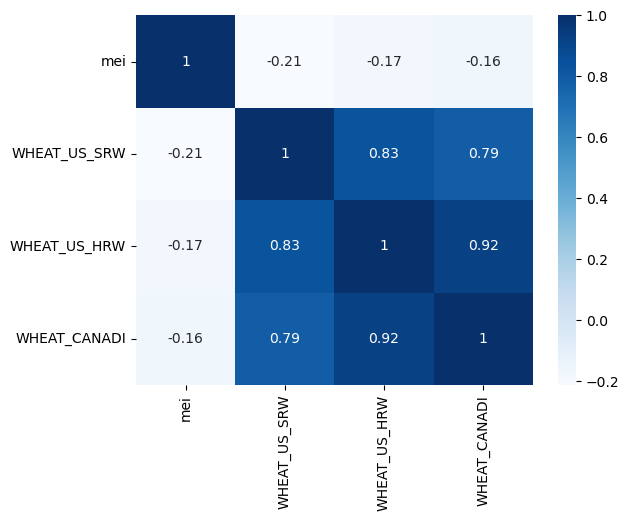

In [337]:
sns.heatmap(dataset[['mei', 'WHEAT_US_SRW', 'WHEAT_US_HRW', 'WHEAT_CANADI']].corr(), annot=True,
            cmap=sns.color_palette("Blues", as_cmap=True))

From the correlationplot, it shows that MEI has a negative relationship with WHEAT_US_SRW, WHEAT_US_HRW and WHEAT_CANADI.

When there is a La Niña phase, wheat price will goes up due to mei has a negative index. Cold weather may leads to a lower production, according to the economic demand-supply curve, that lower crops production and consistent demands leads to a higher price. 

In conctrast, if it's a El Niño phase, the price will goes down since warm weather and sufficient percipitation. The price of wheat will drop.

<img src="https://cdn.britannica.com/90/164690-050-33BD0AC9/Illustration-increase-decrease-equilibrium-price-quantity-shift.jpg" width=500/>

- "El Niño and La Niña: Effects on the Midwest" by the National Oceanic and Atmospheric Administration (NOAA). Available at: https://www.ncdc.noaa.gov/teleconnections/enso/indicators/precipitation.php
- "The El Niño–Southern Oscillation and rainfall variability in Australia" by David J. Karoly, in the journal Weather and Climate Extremes. Available at: https://www.sciencedirect.com/science/article/pii/S2212094717300381

Note: MEI is not the only factor affect the price. When we look at the price trend plot, there is a price spike which may caused by 2007-2008 food crisis and global financial crisis.
- https://en.wikipedia.org/wiki/2007–2008_world_food_price_crisis
- https://en.wikipedia.org/wiki/2007–2008_financial_crisis

# Build Auto Regressive Model use ARIMA

ARIMA stands for Autoregressive Integrated Moving Average. It is a popular statistical model used for time series analysis and forecasting.

ARIMA combines three components:
- The autoregressive (AR) component, which models the dependence of the current value on past values,
- The integrated (I) component, which models the differencing required to make the time series stationary,
- The moving average (MA) component, which models the dependence of the current value on past errors.

ARIMA models can be used to model both trend and seasonal patterns in time series data. The model is typically specified by three parameters:
- p: the number of autoregressive terms,
- d: the number of nonseasonal differences,
- q: the number of moving average terms.

SARIMA standas for Seasonal ARIMA. SARIMA is an extension of the ARIMA model that incorporates seasonality. 
- p (AutoRegressive order)
- d (Integrated order)
- q (Moving Average order)
- P (Seasonal AutoRegressive order)
- D (Seasonal Integrated order)
- Q (Seasonal Moving Average order)
- s (Seasonal period)

```python
# Define the SARIMA parameters
p, d, q = 1, 1, 1
P, D, Q, s = 1, 1, 1, 12

# Fit the SARIMA model
model = sm.tsa.statespace.SARIMAX(data, order=(p, d, q), seasonal_order=(P, D, Q, s), enforce_stationarity=False, enforce_invertibility=False)
```

In [338]:
# focus on MEI ENSO data
mei_dataset = dataset[['mei', 'log_SRW', 'log_HRW', 'log_CANADI']]
mei_dataset = mei_dataset.loc['1979-02-01':'2012-03-01'] # filter data with no empty value
mei_dataset.index.freq = 'MS'

In [339]:
mei_dataset.isnull().sum()

mei           0
log_SRW       0
log_HRW       0
log_CANADI    0
dtype: int64

# Evaluation Metric

| Metric | Description | Usage | Example | Benefits | Drawbacks |
|--------|-------------|-------|---------|----------|-----------|
| MAE    | Mean Absolute Error is the average of the absolute differences between the predicted and actual values. | Used when you want to measure the average magnitude of the errors without considering their direction. | In a regression problem with target values [3, 4, 5], if predictions are [2, 5, 6], the MAE is (1+1+1)/3 = 1. | Less sensitive to outliers compared to MSE, as errors are not squared. Easier to interpret as it has the same unit as the target variable. | Since it doesn't penalize large errors as much as MSE, it may not be optimal when large errors are undesirable. |
| MSE    | Mean Squared Error is the average of the squared differences between the predicted and actual values. | Used when you want to penalize large errors more than smaller errors, as the errors are squared. | In a regression problem with target values [3, 4, 5], if predictions are [2, 5, 6], the MSE is (1²+1²+1²)/3 = 1. | Emphasizes larger errors, which can be useful when large errors are particularly undesirable. | More sensitive to outliers due to the squaring of errors. The result has a different unit (squared) than the target variable, making it harder to interpret directly. |


## statsmodels.tsa.statespace.sarima.SARIMAX

SARIMAX, which stands for Seasonal AutoRegressive Integrated Moving Average with eXogenous variables, is a versatile model that can be used to capture various components of a time series, including autoregressive and moving average patterns, as well as seasonality and exogenous factors. SARIMAX is an extension of ARIMA (AutoRegressive Integrated Moving Average) and can indeed perform as a regular AR or ARIMA model when seasonal and exogenous components are not included.

One of the primary reasons to use SARIMAX instead of AR or ARIMA is its ability to handle seasonal patterns. Many time series, especially those related to climate and weather, exhibit strong seasonal behavior. SARIMAX can capture these seasonal patterns by incorporating a seasonal component into the model. This feature makes SARIMAX particularly suitable for time series analysis in climate-related applications.

Additionally, SARIMAX is capable of incorporating exogenous variables, which are external factors that can influence the time series. This feature is especially useful when analyzing complex systems where multiple factors may affect the observed data. In the context of climate-related studies, exogenous variables can include factors such as greenhouse gas emissions, land-use changes, or other climatic variables that could potentially impact the target variable.

In summary, SARIMAX is a powerful and flexible model that can be used to analyze time series data with seasonal patterns and external influences. Its ability to perform as a regular AR or ARIMA model, combined with its capacity to handle seasonal factors and exogenous variables, makes SARIMAX an excellent choice for climate-related time series analysis.

## ARIMA MEI - WHEAT_US_SRW

In [348]:
# define hyperparameters for AR analysis
# use auto_arima determine the best parameter
base_model = auto_arima(
        mei_dataset['log_SRW'],
        seasonal=True,
        stepwise=False,
        suppress_warnings=True,
        trace=True,
        m=12,
        error_action="ignore",
        n_jobs=-1,
        information_criterion='aic',
        scoring='mse'
)


Best model:  ARIMA(0,0,1)(2,0,1)[12] intercept
Total fit time: 5.004 seconds


In [350]:
# check order and seasonal order parameter
order, seasonal_order = base_model.order, base_model.seasonal_order

In [354]:
# define the base model with the log return, price only
ar_model0 = SARIMAX(endog=mei_dataset['log_SRW'], 
                   order=order, seasonal_order=seasonal_order, freq='MS').fit(maxiter=1000, method='powell')
ar_model0.summary()

Optimization terminated successfully.
         Current function value: -1.334525
         Iterations: 5
         Function evaluations: 303


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                            log_SRW   No. Observations:                  398
Model:             SARIMAX(0, 0, 1)x(2, 0, 1, 12)   Log Likelihood                 531.141
Date:                            Wed, 03 May 2023   AIC                          -1052.282
Time:                                    10:35:03   BIC                          -1032.350
Sample:                                02-01-1979   HQIC                         -1044.387
                                     - 03-01-2012                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.1967      0.039      5.030      0.000       0.120       0.273
ar.S.L12      -0.5182      0.281     -1.843      0.065      -1.069       0.033
ar.S.L24      -0.0893      0.069     -1.303      0.193      -0.224       0.045
ma.S.L12       0.5663      0.278      2.039      0.041       0.022       1.111
sigma2         0.0041      0.000     17.567      0.000       0.004       0.005
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                33.36
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):               1.75   Skew:                            -0.21
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.36
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [554]:
# create qq-plot and residual plot
m0_residuals = ar_model0.resid.dropna()
m0_res_x, m0_res_y = m0_residuals.index, m0_residuals.values

m0_qq_x, m0_qq_y = probplot(m0_residuals, fit=True)[0]

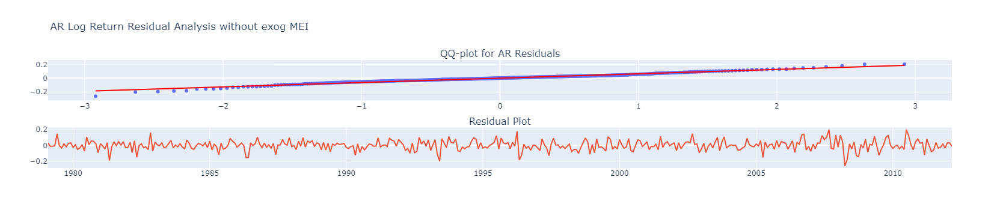

In [568]:
# create residual plot
m0_res_fig = sp.make_subplots(rows=2, cols=1, 
                                   subplot_titles=("QQ-plot for AR Residuals", "Residual Plot"))

m0_res_fig.add_trace(go.Scatter(x=m0_qq_x, y=m0_qq_y, mode="markers", 
                                        name="Residuals", marker=dict(size=6)), 
                             row=1, col=1)
m0_res_fig.add_trace(go.Scatter(x=m0_res_x, y=m0_res_y, 
                                           mode="lines", name="Residuals"), 
                              row=2, col=1)

# fit an simple regression line for normality check
m0_slope, m0_intercept = np.polyfit(m0_qq_x, m0_qq_y, 1)
m0_qq_line = m0_slope * m0_qq_x + m0_intercept

m0_res_fig.add_trace(go.Scatter(x=m0_qq_x, y=m0_qq_line, mode="lines", 
                         name="Fitted Line", line=dict(color="red")), 
              row=1, col=1)

m0_res_fig.update_layout(
    title="AR Log Return Residual Analysis without exog MEI",
    showlegend=False,
)

# display the plot
m0_res_fig.show()

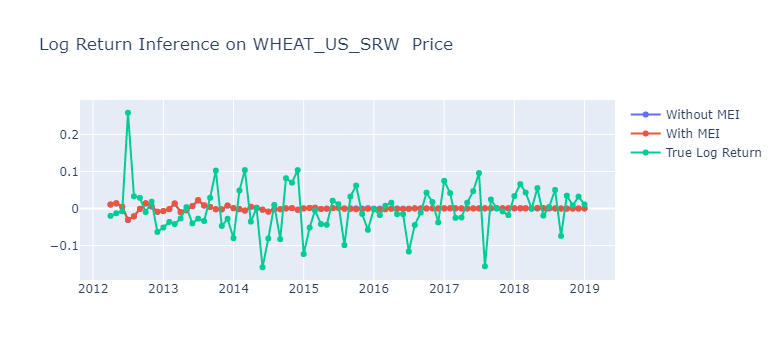

In [587]:
# check log return 
ar_model_fig0 = go.Figure()

ar_model0_inference = ar_model0.get_forecast(exog=dataset['mei'].loc['2012-03-01':].dropna(), steps=82)
ar_model1_inference = ar_model1.get_forecast(exog=dataset['mei'].loc['2012-03-01':].dropna(), steps=82)
ar_model_fig0.add_trace(go.Scatter(x=ar_model0_inference.predicted_mean.index, y=ar_model0_inference.predicted_mean, 
                                  mode="lines+markers", name='Without MEI'))
ar_model_fig0.add_trace(go.Scatter(x=ar_model1_inference.predicted_mean.index, y=ar_model1_inference.predicted_mean, 
                                  mode="lines+markers", name='With MEI', marker=dict(opacity=1)))
ar_model_fig0.add_trace(go.Scatter(x=ar_model0_inference.predicted_mean.index, y=wb_wheat[wb_wheat['date'] > '2012-03']['log_SRW'], 
                                  mode="lines+markers", name='True Log Return', marker=dict(opacity=1)))


ar_model_fig0.update_layout(title="Log Return Inference on WHEAT_US_SRW  Price")
ar_model_fig0.show()

In [356]:
ar_model1 = SARIMAX(endog=mei_dataset['log_SRW'], exog=mei_dataset[['mei']], 
                    order=order, seasonal_order=seasonal_order, freq='MS').fit(maxiter=1000, method='powell')

ar_model1.summary()

Optimization terminated successfully.
         Current function value: -1.334664
         Iterations: 6
         Function evaluations: 406


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                            log_SRW   No. Observations:                  398
Model:             SARIMAX(0, 0, 1)x(2, 0, 1, 12)   Log Likelihood                 531.196
Date:                            Wed, 03 May 2023   AIC                          -1050.392
Time:                                    10:35:29   BIC                          -1026.473
Sample:                                02-01-1979   HQIC                         -1040.918
                                     - 03-01-2012                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mei           -0.0012      0.003     -0.335      0.738      -0.008       0.006
ma.L1          0.2021      0.039      5.174      0.000       0.126       0.279
ar.S.L12      -0.5335      0.279     -1.914      0.056      -1.080       0.013
ar.S.L24      -0.0873      0.069     -1.270      0.204      -0.222       0.047
ma.S.L12       0.5810      0.275      2.112      0.035       0.042       1.120
sigma2         0.0041      0.000     17.569      0.000       0.004       0.005
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                33.42
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               1.74   Skew:                            -0.21
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.35
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

 ARIMA(0,0,2)(2,0,0)[12] intercept   : BIC=-1021.870, Time=0.69 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : BIC=-1020.335, Time=0.38 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : BIC=-1018.735, Time=1.08 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=-1050.282, Time=0.97 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=-1044.322, Time=0.59 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=-1044.449, Time=0.40 sec
 ARIMA(4,0,0)(0,0,0)[12] intercept   : AIC=-1044.335, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-1049.794, Time=0.15 sec
 ARIMA(0,0,5)(0,0,0)[12] intercept   : AIC=-1046.515, Time=0.64 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=-1048.284, Time=1.13 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=-1044.373, Time=0.46 sec
 ARIMA(0,0,3)(1,0,0)[12] intercept   : BIC=-1020.335, Time=0.41 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : BIC=inf, Time=2.25 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=-1036.077, Time=1.59 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=-1045.914, 

In [558]:
# create qq-plot and residual plot
m1_residuals = ar_model1.resid.dropna()
m1_res_x, m1_res_y = m1_residuals.index, m1_residuals.values

m1_qq_x, m1_qq_y = probplot(m1_residuals, fit=True)[0]

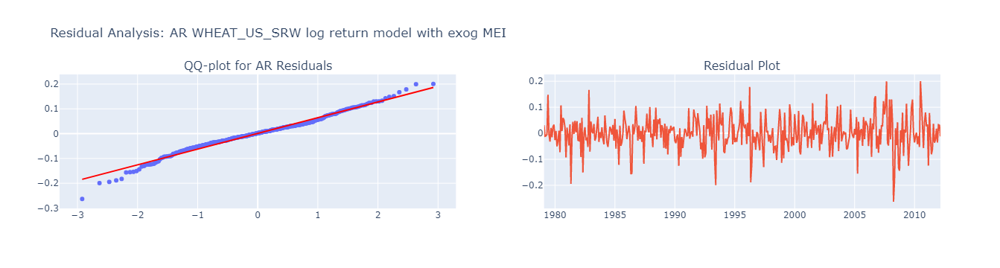

In [651]:
# create residual plot
m1_res_fig = sp.make_subplots(rows=1, cols=2, 
                                   subplot_titles=("QQ-plot for AR Residuals", "Residual Plot"))

m1_res_fig.add_trace(go.Scatter(x=m1_qq_x, y=m1_qq_y, mode="markers", 
                                        name="Residuals", marker=dict(size=6)), 
                             row=1, col=1)
m1_res_fig.add_trace(go.Scatter(x=m1_res_x, y=m1_res_y, 
                                           mode="lines", name="Residuals"), 
                              row=1, col=2)

# fit an simple regression line for normality check
m1_slope, m1_intercept = np.polyfit(m1_qq_x, m1_qq_y, 1)
m1_qq_line = m1_slope * m1_qq_x + m1_intercept

m1_res_fig.add_trace(go.Scatter(x=m1_qq_x, y=m1_qq_line, mode="lines", 
                         name="Fitted Line", line=dict(color="red")), 
              row=1, col=1)

m1_res_fig.update_layout(
    title="Residual Analysis: AR WHEAT_US_SRW log return model with exog MEI",
    showlegend=False,
)

# display the plot
m1_res_fig.show()

In [634]:
# calculate RMAE for both model, RMAE description in later section
ar_m0_inference = ar_model0.predict(steps=82)
ar_m0_mae = mean_absolute_error(y_pred=ar_m0_inference,
                                y_true=dataset['log_SRW'].loc['1979-02-01':'2012-03-01'])
np.sqrt(ar_m0_mae)

0.21766389603914488

In [652]:
# calculate RMAE for both model, RMAE description in later section
ar_m1_inference = ar_model1.predict(exog=dataset['mei'], steps=82)
ar_m1_mae = mean_absolute_error(y_pred=ar_m1_inference,
                                y_true=dataset['log_SRW'].loc['1979-02-01':'2012-03-01'])
ar_m1_mae, np.sqrt(ar_m1_mae)

(0.04739488860331589, 0.2177036715430309)

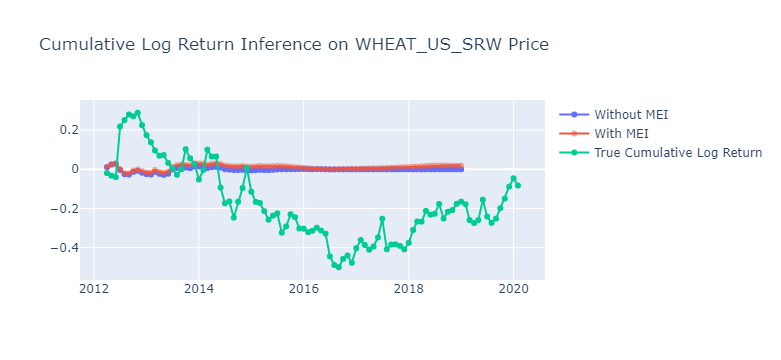

In [586]:
ar_model_fig1 = go.Figure()

ar_model0_cum_inference = ar_model0.get_forecast(exog=dataset['mei'].loc['2012-03-01':].dropna(), steps=82)
ar_model1_cum_inference = ar_model1.get_forecast(exog=dataset['mei'].loc['2012-03-01':].dropna(), steps=82)

ar_model_fig1.add_trace(go.Scatter(x=ar_model0_cum_inference.predicted_mean.index, y=np.cumsum(ar_model0_cum_inference.predicted_mean), 
                                  mode="lines+markers", name='Without MEI'))
ar_model_fig1.add_trace(go.Scatter(x=ar_model1_cum_inference.predicted_mean.index, y=np.cumsum(ar_model1_cum_inference.predicted_mean), 
                                  mode="lines+markers", name='With MEI', marker=dict(opacity=0.5)))
ar_model_fig1.add_trace(go.Scatter(x=pd.to_datetime(wb_wheat[wb_wheat['date'] > '2012-03'].date), y=np.cumsum(wb_wheat[wb_wheat['date'] > '2012-03']['log_SRW']), 
                                  mode="lines+markers", name='True Cumulative Log Return'))

ar_model_fig1.update_layout(title="Cumulative Log Return Inference on WHEAT_US_SRW Price")
ar_model_fig1.show()

- Model 1 (ar_model0): AIC = -1052.282, BIC = -1032.350
- Model 2 (ar_model1): AIC = -1050.392, BIC = -1026.473

Comparing the AIC values, Model 1 has a lower AIC (-1052.282) than Model 2 (-1050.392), indicating that Model 1 has a better balance between goodness of fit and model complexity.

On the other hand, comparing the BIC values, Model 1 has a lower BIC (-1032.350) than Model 2 (-1026.473), suggesting that Model 1 is a better choice according to the BIC criterion, which puts more emphasis on penalizing model complexity.

In summary, model 1 is slightly prefer than model 2.

In [561]:
# check order and seasonal order parameter
order, seasonal_order = base_model.order, base_model.seasonal_order

# define the base model with the log return, price only for WHEAHT_HRW
ar_model3 = SARIMAX(endog=mei_dataset['log_HRW'], 
                   order=order, seasonal_order=seasonal_order, freq='MS').fit(maxiter=1000, method='powell')
ar_model4 = SARIMAX(endog=mei_dataset['log_HRW'], exog=mei_dataset[['mei']], 
                    order=order, seasonal_order=seasonal_order, freq='MS').fit(maxiter=1000, method='powell')

Optimization terminated successfully.
         Current function value: -1.496426
         Iterations: 2
         Function evaluations: 114
Optimization terminated successfully.
         Current function value: -1.498563
         Iterations: 2
         Function evaluations: 136


In [564]:
# create qq-plot and residual plot
m3_residuals = ar_model3.resid.dropna()
m3_res_x, m3_res_y = m3_residuals.index, m3_residuals.values

m3_qq_x, m3_qq_y = probplot(m3_residuals, fit=True)[0]

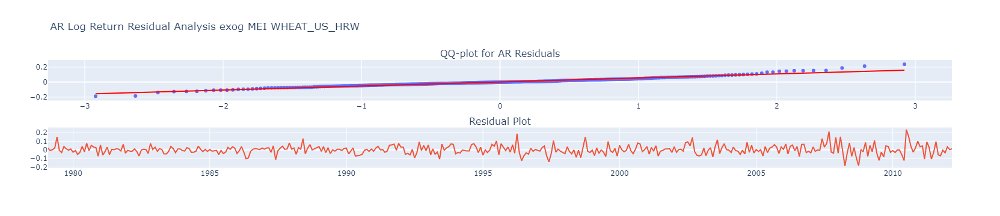

In [647]:
# create residual plot
m3_res_fig = sp.make_subplots(rows=2, cols=1, 
                                   subplot_titles=("QQ-plot for AR Residuals", "Residual Plot"))

m3_res_fig.add_trace(go.Scatter(x=m3_qq_x, y=m3_qq_y, mode="markers", 
                                        name="Residuals", marker=dict(size=6)), 
                             row=1, col=1)
m3_res_fig.add_trace(go.Scatter(x=m3_res_x, y=m3_res_y, 
                                           mode="lines", name="Residuals"), 
                              row=2, col=1)

# fit an simple regression line for normality check
m3_slope, m3_intercept = np.polyfit(m3_qq_x, m3_qq_y, 1)
m3_qq_line = m3_slope * m3_qq_x + m3_intercept

m3_res_fig.add_trace(go.Scatter(x=m3_qq_x, y=m3_qq_line, mode="lines", 
                         name="Fitted Line", line=dict(color="red")), 
              row=1, col=1)

m3_res_fig.update_layout(
    title="AR Log Return Residual Analysis exog MEI WHEAT_US_HRW",
    showlegend=False,
)

# display the plot
m3_res_fig.show()

In [569]:
# create qq-plot and residual plot
m4_residuals = ar_model4.resid.dropna()
m4_res_x, m4_res_y = m4_residuals.index, m4_residuals.values

m4_qq_x, m4_qq_y = probplot(m4_residuals, fit=True)[0]

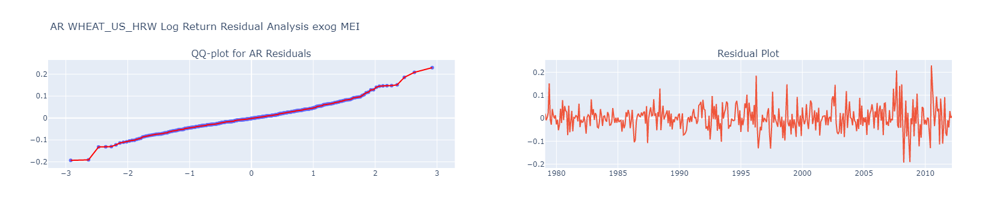

In [646]:
# create residual plot
m4_res_fig = sp.make_subplots(rows=1, cols=2, 
                                   subplot_titles=("QQ-plot for AR Residuals", "Residual Plot"))

m4_res_fig.add_trace(go.Scatter(x=m4_qq_x, y=m4_qq_y, mode="markers", 
                                        name="Residuals", marker=dict(size=6)), 
                             row=1, col=1)
m4_res_fig.add_trace(go.Scatter(x=m4_res_x, y=m4_res_y, 
                                           mode="lines", name="Residuals"), 
                              row=1, col=2)

# fit an simple regression line for normality check
m4_slope, m4_intercept = np.polyfit(m4_qq_x, m4_qq_y, 1)
m4_qq_line = m4_slope * m4_qq_x + m4_intercept

m4_res_fig.add_trace(go.Scatter(x=m4_qq_x, y=m4_qq_y, mode="lines", 
                         name="Fitted Line", line=dict(color="red")), 
              row=1, col=1)

m4_res_fig.update_layout(
    title="AR WHEAT_US_HRW Log Return Residual Analysis exog MEI",
    showlegend=False,
)

# display the plot
m4_res_fig.show()

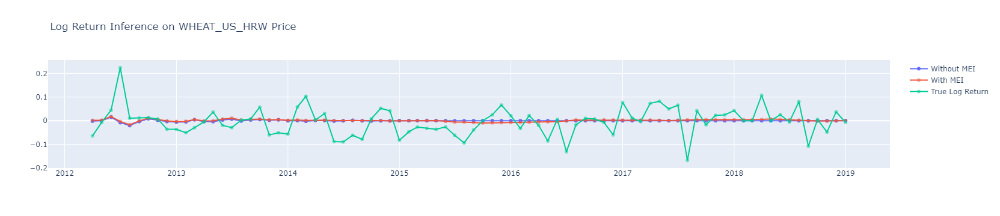

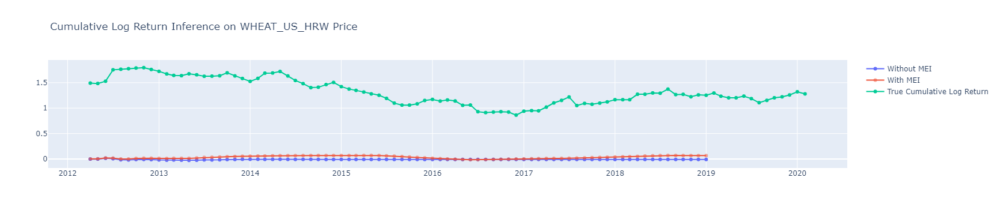

In [585]:
ar_model_fig2 = go.Figure()

ar_model3_inference = ar_model3.get_forecast(exog=dataset['mei'].loc['2012-03-01':].dropna(), steps=82)
ar_model4_inference = ar_model4.get_forecast(exog=dataset['mei'].loc['2012-03-01':].dropna(), steps=82)
ar_model_fig2.add_trace(go.Scatter(x=ar_model3_inference.predicted_mean.index, y=ar_model3_inference.predicted_mean, 
                                  mode="lines+markers", name='Without MEI'))
ar_model_fig2.add_trace(go.Scatter(x=ar_model4_inference.predicted_mean.index, y=ar_model4_inference.predicted_mean, 
                                  mode="lines+markers", name='With MEI', marker=dict(opacity=0.5)))
ar_model_fig2.add_trace(go.Scatter(x=ar_model0_inference.predicted_mean.index, y=wb_wheat[wb_wheat['date'] > '2012-03']['log_HRW'], 
                                  mode="lines+markers", name='True Log Return', marker=dict(opacity=0.5)))

ar_model_fig2.update_layout(title="Log Return Inference on WHEAT_US_HRW Price")
ar_model_fig2.show()

ar_model_fig3 = go.Figure()

ar_model3_cum_inference = ar_model3.get_forecast(exog=dataset[['mei']].loc['2012-03-01':].dropna(), steps=82)
ar_model4_cum_inference = ar_model4.get_forecast(exog=dataset[['mei']].loc['2012-03-01':].dropna(), steps=82)

ar_model_fig3.add_trace(go.Scatter(x=ar_model3_cum_inference.predicted_mean.index, y=np.cumsum(ar_model3_cum_inference.predicted_mean), 
                                  mode="lines+markers", name='Without MEI'))
ar_model_fig3.add_trace(go.Scatter(x=ar_model4_cum_inference.predicted_mean.index, y=np.cumsum(ar_model4_cum_inference.predicted_mean), 
                                  mode="lines+markers", name='With MEI', marker=dict(opacity=0.5)))
ar_model_fig3.add_trace(go.Scatter(x=pd.to_datetime(wb_wheat[wb_wheat['date'] > '2012-03'].date), y=wb_wheat[wb_wheat['date'] > '2012-03']['cum_log_HRW'], 
                                  mode="lines+markers", name='True Cumulative Log Return'))

ar_model_fig3.update_layout(title="Cumulative Log Return Inference on WHEAT_US_HRW Price")
ar_model_fig3.show()

In [404]:
# define the base model with the log return, price only for WHEAT_CANADI
ar_model5 = SARIMAX(endog=mei_dataset['log_CANADI'], 
                   order=order, seasonal_order=seasonal_order, freq='MS').fit(maxiter=1000, method='powell')
ar_model6 = SARIMAX(endog=mei_dataset['log_CANADI'], exog=mei_dataset[['mei']], 
                    order=order, seasonal_order=seasonal_order, freq='MS').fit(maxiter=1000, method='powell')

Optimization terminated successfully.
         Current function value: -1.501328
         Iterations: 2
         Function evaluations: 122
Optimization terminated successfully.
         Current function value: -1.502672
         Iterations: 2
         Function evaluations: 135


In [571]:
# create qq-plot and residual plot
m5_residuals = ar_model5.resid.dropna()
m5_res_x, m5_res_y = m5_residuals.index, m5_residuals.values

m5_qq_x, m5_qq_y = probplot(m5_residuals, fit=True)[0]

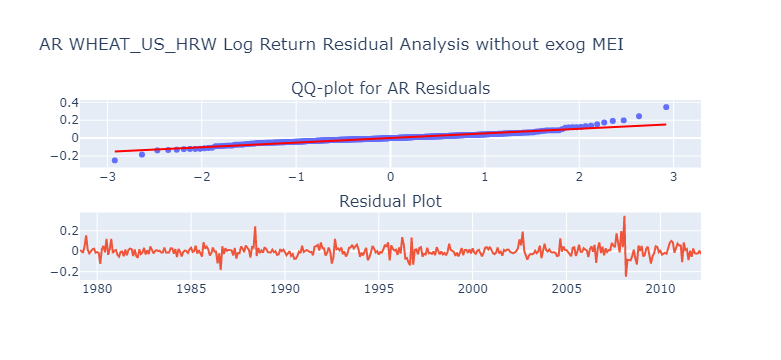

In [580]:
# create residual plot
m5_res_fig = sp.make_subplots(rows=2, cols=1, 
                                   subplot_titles=("QQ-plot for AR Residuals", "Residual Plot"))

m5_res_fig.add_trace(go.Scatter(x=m5_qq_x, y=m5_qq_y, mode="markers", 
                                        name="Residuals", marker=dict(size=6)), 
                             row=1, col=1)
m5_res_fig.add_trace(go.Scatter(x=m5_res_x, y=m5_res_y, 
                                           mode="lines", name="Residuals"), 
                              row=2, col=1)

# fit an simple regression line for normality check
m5_slope, m5_intercept = np.polyfit(m5_qq_x, m5_qq_y, 1)
m5_qq_line = m5_slope * m5_qq_x + m5_intercept

m5_res_fig.add_trace(go.Scatter(x=m5_qq_x, y=m5_qq_line, mode="lines", 
                         name="Fitted Line", line=dict(color="red")), 
              row=1, col=1)

m5_res_fig.update_layout(
    title="AR WHEAT_US_HRW Log Return Residual Analysis without exog MEI",
    showlegend=False,
)

# display the plot
m5_res_fig.show()

In [574]:
# create qq-plot and residual plot
m6_residuals = ar_model6.resid.dropna()
m6_res_x, m6_res_y = m3_residuals.index, m6_residuals.values

m6_qq_x, m6_qq_y = probplot(m6_residuals, fit=True)[0]

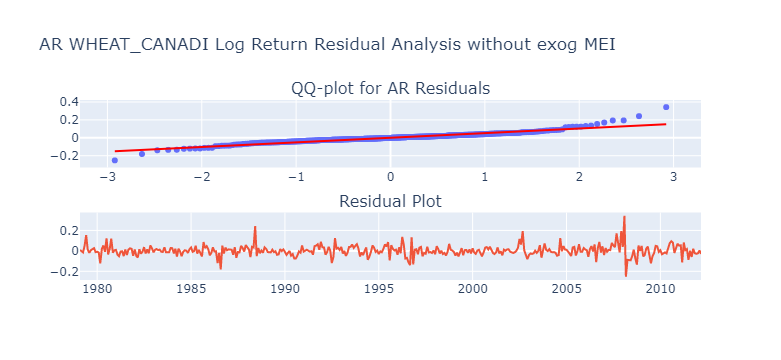

In [579]:
# create residual plot
m6_res_fig = sp.make_subplots(rows=2, cols=1, 
                                   subplot_titles=("QQ-plot for AR Residuals", "Residual Plot"))

m6_res_fig.add_trace(go.Scatter(x=m6_qq_x, y=m6_qq_y, mode="markers", 
                                        name="Residuals", marker=dict(size=6)), 
                             row=1, col=1)
m6_res_fig.add_trace(go.Scatter(x=m6_res_x, y=m6_res_y, 
                                           mode="lines", name="Residuals"), 
                              row=2, col=1)

# fit an simple regression line for normality check
m6_slope, m6_intercept = np.polyfit(m6_qq_x, m6_qq_y, 1)
m6_qq_line = m6_slope * m6_qq_x + m6_intercept

m6_res_fig.add_trace(go.Scatter(x=m6_qq_x, y=m6_qq_line, mode="lines", 
                         name="Fitted Line", line=dict(color="red")), 
              row=1, col=1)

m6_res_fig.update_layout(
    title="AR WHEAT_CANADI Log Return Residual Analysis without exog MEI",
    showlegend=False,
)

# display the plot
m6_res_fig.show()

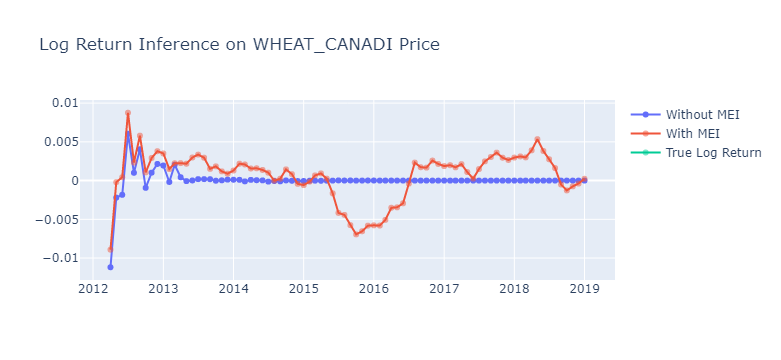

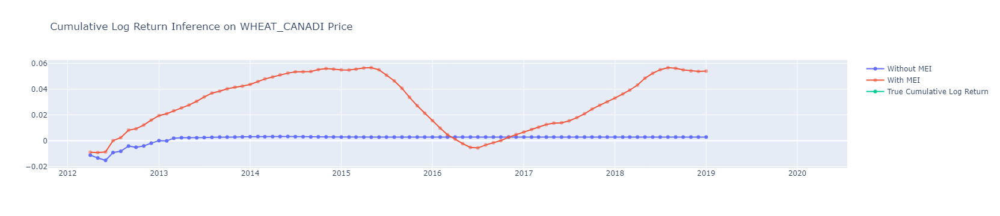

In [583]:
ar_model_fig4 = go.Figure()

ar_model5_inference = ar_model5.get_forecast(exog=dataset[['mei']].loc['2012-03-01':].dropna(), steps=82)
ar_model6_inference = ar_model6.get_forecast(exog=dataset[['mei']].loc['2012-03-01':].dropna(), steps=82)
ar_model_fig4.add_trace(go.Scatter(x=ar_model5_inference.predicted_mean.index, y=ar_model5_inference.predicted_mean, 
                                  mode="lines+markers", name='Without MEI'))
ar_model_fig4.add_trace(go.Scatter(x=ar_model6_inference.predicted_mean.index, y=ar_model6_inference.predicted_mean, 
                                  mode="lines+markers", name='With MEI', marker=dict(opacity=0.5)))
ar_model_fig4.add_trace(go.Scatter(x=ar_model0_inference.predicted_mean.index, y=wb_wheat[wb_wheat['date'] > '2012-03']['log_CANADI'], 
                                  mode="lines+markers", name='True Log Return', marker=dict(opacity=0.5)))

ar_model_fig4.update_layout(title="Log Return Inference on WHEAT_CANADI Price")
ar_model_fig4.show()

ar_model_fig5 = go.Figure()

ar_model5_cum_inference = ar_model5.get_forecast(exog=dataset[['mei']].loc['2012-03-01':].dropna(), steps=82)
ar_model6_cum_inference = ar_model6.get_forecast(exog=dataset[['mei']].loc['2012-03-01':].dropna(), steps=82)

ar_model_fig5.add_trace(go.Scatter(x=ar_model5_cum_inference.predicted_mean.index, y=np.cumsum(ar_model5_cum_inference.predicted_mean), 
                                  mode="lines+markers", name='Without MEI'))
ar_model_fig5.add_trace(go.Scatter(x=ar_model6_cum_inference.predicted_mean.index, y=np.cumsum(ar_model6_cum_inference.predicted_mean), 
                                  mode="lines+markers", name='With MEI', marker=dict(opacity=0.5)))
ar_model_fig5.add_trace(go.Scatter(x=pd.to_datetime(wb_wheat[wb_wheat['date'] > '2012-03'].date), y=wb_wheat[wb_wheat['date'] > '2012-03']['cum_log_CANADI'], 
                                  mode="lines+markers", name='True Cumulative Log Return'))

ar_model_fig5.update_layout(title="Cumulative Log Return Inference on WHEAT_CANADI Price")
ar_model_fig5.show()

> No true value available for CANADI

According to the plot, use single factor MEI doesn't provide better inference result. With or without MEI return a similar result which is a flat line. This is more significant when showing the cumulative log return. Base model with exog factor MEI or not doesn't provide a better information. 

This conclusion also applies to `WHEAT_US_HRW` and `WHEAT_CANADI`. However, it looks like MEI does provide some contribution towards `CANADI` log return. But the model still doesn't provide a greate result due to the circulation happens about every 3 years, which satisfy the ENSO pattern but not the economic expecation. Therefore, we try to incorporate with some external factors to see if there is an improvement when including more variable.

Because the climate model is a huge model and most likely is non-linear dependent with other factors despite our obsevation is i.i.d. Underlying interaction may has a signficant effect towards the model final result.

# Working with more factors (CO2)

Try to incorporate with CO2 data. CO2 can have a major impact on global economy in:
- climate crisis: e.g. hurricanes, floods, droughts which leads damage to infrastructure, disrupt supply chain, yields of crops etc.
- Increase energy cost, shift from fossil fuels to green energies.
- Government policy on carbon pricing (emission control) which also affect trading strategies and economic market.

<details>
<summary>Reference</summary>
    
- Climate Change Impacts: Intergovernmental Panel on Climate Change (IPCC). (2014). Climate Change 2014: Impacts, Adaptation, and Vulnerability. Cambridge, UK: Cambridge University Press.
- Energy Costs: International Energy Agency (IEA). (2020). World Energy Outlook 2020. Paris: IEA.
- Carbon Pricing: World Bank. (2021). State and Trends of Carbon Pricing 2021. Washington, DC: World Bank Group.
- Trade Impacts: International Trade Centre (ITC). (2021). Trade and Climate Change: A Guide to the Paris Agreement for Business. Geneva: ITC.
    
</details>


CO2 monthly data is available at NOAA https://gml.noaa.gov/webdata/ccgg/trends/co2/co2_mm_mlo.csv.

In [407]:
# read data
co2_country_df = pd.read_csv('../data/external/co2_mm_mlo.csv', skiprows=56)
co2_country_df['date'] = pd.to_datetime(co2_country_df.agg(lambda x: f"{int(x.year)}-{int(x.month)}", axis=1))
co2_country_df.set_index('date', inplace=True)

# select data from 1979-01 to 2012-05-01
co2_country_df = co2_country_df[['average']]
co2_country_df = co2_country_df.rename(columns={'average': 'co2_average'})
co2_country_df

,co2_average
date,
1958-03-01,315.70
1958-04-01,317.45
1958-05-01,317.51
1958-06-01,317.24
1958-07-01,315.86
...,...
2022-11-01,417.51
2022-12-01,418.95
2023-01-01,419.47


In [408]:
# merge co2_data
dataset = pd.merge(dataset, co2_country_df, left_index=True, right_index=True, how='left')
mei_dataset = pd.merge(mei_dataset, co2_country_df, left_index=True, right_index=True)
mei_dataset.index.freq = 'MS'

In [409]:
dataset.tail()

,WHEAT_US_SRW,WHEAT_US_HRW,WHEAT_CANADI,log_SRW,log_HRW,log_CANADI,cum_log_SRW,cum_log_HRW,cum_log_CANADI,mei,...,iod_index,nhtele_index_1,nhtele_index_2,nhtele_index_3,nhtele_index_4,pna_index,psa_index_1,psa_index_2,sam_index,co2_average
date,,,,,,,,,,,,,,,,,,,,,
2018-08-01,217.500,236.625,372.75,0.050084,0.080835,NaN,0.437881,1.374218,NaN,0.144861,...,1.137964,-0.450036,1.078885,-2.233051,0.974322,-0.740481,0.364539,1.113363,-0.322401,407.16
2018-09-01,202.000,212.375,372.75,-0.073931,-0.108123,NaN,0.363950,1.266095,NaN,0.364861,...,1.770952,-1.510670,1.832556,-1.370552,0.675671,-1.584611,-0.300852,0.352816,1.028305,405.71
2018-10-01,209.125,213.500,372.75,0.034664,0.005283,NaN,0.398615,1.271378,NaN,0.213739,...,1.530476,-1.769725,1.733359,0.070712,-0.614056,0.166716,0.336696,-0.786435,-0.117035,406.19
2018-11-01,210.875,203.500,372.75,0.008333,-0.047971,NaN,0.406948,1.223407,NaN,0.109718,...,2.091921,0.765005,0.129299,-2.338415,1.793471,-0.230264,0.000805,-0.200025,0.892080,408.21
2018-12-01,217.750,211.250,372.75,0.032082,0.037376,NaN,0.439030,1.260783,NaN,-0.066669,...,1.968903,0.326827,-0.308922,0.256875,-0.327921,0.467829,-0.063912,-0.128670,0.623874,409.27


<Axes: >

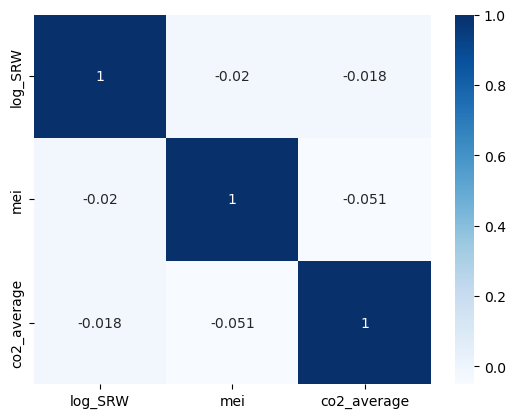

In [410]:
sns.heatmap(dataset[['log_SRW', 'mei', 'co2_average']].corr(), annot=True, 
            cmap=sns.color_palette("Blues", as_cmap=True))

In [412]:
ar_model7 = SARIMAX(endog=mei_dataset['log_SRW'],
                    exog=mei_dataset[['co2_average', 'mei']],
                    order=order, seasonal_order=seasonal_order, 
                    freq='MS', enforce_stationarity=False, enforce_invertibility=False).fit(maxiter=1000, method='powell')

ar_model7.summary()

Optimization terminated successfully.
         Current function value: -1.238479
         Iterations: 2
         Function evaluations: 136


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                            log_SRW   No. Observations:                  398
Model:             SARIMAX(0, 0, 1)x(2, 0, 1, 12)   Log Likelihood                 492.915
Date:                            Wed, 03 May 2023   AIC                           -971.829
Time:                                    11:05:42   BIC                           -944.359
Sample:                                02-01-1979   HQIC                          -960.922
                                     - 03-01-2012                                         
Covariance Type:                              opg                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
co2_average  1.886e-06   1.16e-05      0.163      0.871   -2.08e-05    2.46e-05
mei            -0.0013      0.004     -0.352      0.725      -0.009       0.006
ma.L1           0.2141      0.040      5.402      0.000       0.136       0.292
ar.S.L12       -0.0025      0.419     -0.006      0.995      -0.824       0.819
ar.S.L24       -0.0719      0.063     -1.135      0.256      -0.196       0.052
ma.S.L12        0.0535      0.423      0.126      0.899      -0.776       0.883
sigma2          0.0042      0.000     16.151      0.000       0.004       0.005
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                33.88
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               1.84   Skew:                            -0.23
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.40
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [421]:
ar_model7_inference = ar_model7.predict(start='2012-03-01', end='2018-12-01', exog=dataset[['mei', 'co2_average']].loc['2012-03-01':'2018-11-01'])

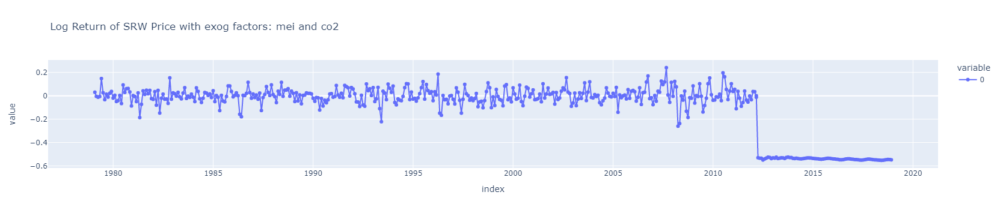

In [423]:
px.line(pd.concat([mei_dataset['log_SRW'], ar_model7_inference]),
        markers=True,
        title="Log Return of SRW Price with exog factors: mei and co2")

From the summary table, AIC has a result of -971.829 and BIC of -944.359. which means there isn't a result improvement based on including CO2 factor compare with model 1. Probably because CO2 has low correlation with ENSO factor. Based on the correlation plot, both MEI and CO2 have correlation around -0.02. 

# Experiment with all JRA55 parameters

## LOG_WHEAT_US_SRW

As mentioned before, we can't certainly conclude that all factors does zero contribution towards the log_SRW price. Thus, we try to include all factors in the model to see how result will change.

In [428]:
# re define dataset
dataset = pd.merge(wb_wheat, jra55_df, on='date', how='left') 
dataset = dataset.set_index(pd.to_datetime(dataset.date))

In [429]:
mei_dataset1 = dataset[['log_SRW', 'log_HRW', 'log_CANADI', 'ao_index', 'iod_index', 
                        'nhtele_index_1', 'nhtele_index_2', 'nhtele_index_3', 'nhtele_index_4',
                        'pna_index', 'psa_index_1', 'psa_index_2', 'sam_index']].loc['1979-01-01':'2012-12-01'] # exclude CO2 factor

exog_columns = ['ao_index', 'iod_index', 
                'nhtele_index_1', 'nhtele_index_2', 'nhtele_index_3', 'nhtele_index_4',
                'pna_index', 'psa_index_1', 'psa_index_2', 'sam_index']

In [432]:
mei_dataset1.index.freq = 'MS'

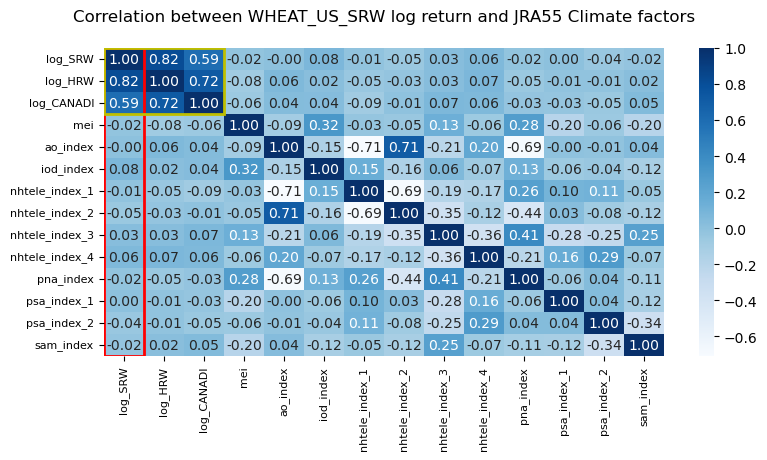

In [693]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.heatmap(dataset[['log_SRW', 'log_HRW', 'log_CANADI', 'mei', 'ao_index', 'iod_index', 
                        'nhtele_index_1', 'nhtele_index_2', 'nhtele_index_3', 'nhtele_index_4',
                        'pna_index', 'psa_index_1', 'psa_index_2', 'sam_index']].loc['1979-01-01':'2012-12-01'].corr(), annot=True, 
            cmap=sns.color_palette("Blues", as_cmap=True), ax=ax, fmt='.2f')

ax.set_title('Correlation between WHEAT_US_SRW log return and JRA55 Climate factors\n')
ax.tick_params(axis='both', which='major', labelsize=8)

rect = patches.Rectangle((0, 0), 1, 14, linewidth=2, edgecolor='r', facecolor='none')
ax.add_patch(rect)
rect = patches.Rectangle((0, 0), 3, 3, linewidth=2, edgecolor='y', facecolor='none')
ax.add_patch(rect)

plt.subplots_adjust(left=0.1, right=0.8)
fig.savefig('/mnt/f/Download/correlation_plot', dpi=300, bbox_inches='tight')

In [449]:
order = (8, 2, 2)
seasonal_order = (8, 1, 1, 12)
ar_model8 = SARIMAX(endog=mei_dataset1['log_SRW'],
                    exog=mei_dataset1[exog_columns],
                    order=order, seasonal_order=seasonal_order, freq='MS',
                    enforce_stationarity=False, enforce_invertibility=False).fit(maxiter=1000, method='powell')

ar_model8.summary()

Optimization terminated successfully.
         Current function value: -0.894476
         Iterations: 15
         Function evaluations: 4268


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                              log_SRW   No. Observations:                  408
Model:             SARIMAX(8, 2, 2)x(8, 1, [1], 12)   Log Likelihood                 364.946
Date:                              Wed, 03 May 2023   AIC                           -669.893
Time:                                      11:17:45   BIC                           -559.796
Sample:                                  01-01-1979   HQIC                          -625.783
                                       - 12-01-2012                                         
Covariance Type:                                opg                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
ao_index          -0.0016      0.009     -0.183      0.855      -0.019       0.016
iod_index          0.0015      0.005      0.282      0.778      -0.009       0.012
nhtele_index_1    -0.0127      0.017     -0.745      0.456      -0.046       0.021
nhtele_index_2    -0.0154      0.019     -0.824      0.410      -0.052       0.021
nhtele_index_3    -0.0037      0.014     -0.256      0.798      -0.032       0.025
nhtele_index_4    -0.0019      0.011     -0.165      0.869      -0.024       0.020
pna_index         -0.0085      0.007     -1.167      0.243      -0.023       0.006
psa_index_1       -0.0055      0.009     -0.645      0.519      -0.022       0.011
psa_index_2        0.0122      0.010      1.235      0.217      -0.007       0.032
sam_index         -0.0006      0.004     -0.132      0.895      -0.009       0.008
ar.L1             -1.1899      0.250     -4.756      0.000      -1.680      -0.700
ar.L2             -1.0816      0.215     -5.041      0.000      -1.502      -0.661
ar.L3             -0.9189      0.219     -4.200      0.000      -1.348      -0.490
ar.L4             -0.7589      0.191     -3.965      0.000      -1.134      -0.384
ar.L5             -0.4609      0.174     -2.647      0.008      -0.802      -0.120
ar.L6             -0.2672      0.130     -2.055      0.040      -0.522      -0.012
ar.L7             -0.1817      0.095     -1.903      0.057      -0.369       0.005
ar.L8             -0.1867      0.064     -2.900      0.004      -0.313      -0.061
ma.L1             -0.5874      2.872     -0.204      0.838      -6.217       5.042
ma.L2             -0.4127      1.144     -0.361      0.718      -2.654       1.829
ar.S.L12          -0.9231      0.250     -3.692      0.000      -1.413      -0.433
ar.S.L24          -0.9379      0.243     -3.864      0.000      -1.414      -0.462
ar.S.L36          -0.7420      0.252     -2.947      0.003      -1.235      -0.249
ar.S.L48          -0.6534      0.212     -3.076      0.002      -1.070      -0.237
ar.S.L60          -0.5248      0.178     -2.944      0.003      -0.874      -0.175
ar.S.L72          -0.3779      0.147     -2.573      0.010      -0.666      -0.090
ar.S.L84          -0.1812      0.112     -1.619      0.105      -0.401       0.038
ar.S.L96           0.0137      0.041      0.336      0.737      -0.066       0.094
ma.S.L12          -0.0753      0.255     -0.295      0.768      -0.575       0.424
sigma2             0.0046      0.013      0.355      0.723      -0.021       0.030
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                29.71
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.15   Skew:                            -0.15
Prob(H) (two-sided):                  0.

In [588]:
# generate inference result
ar_model8_inference = ar_model8.predict(start='2013-01-01', end='2018-12-01', 
                                        exog=dataset[exog_columns].loc['2013-01-01':'2018-12-01'])

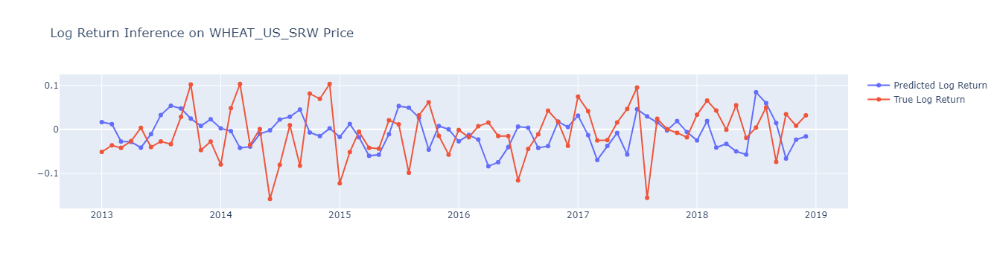

In [653]:
# result visualisation
sar_srw_fig = go.Figure()

sar_srw_fig.add_trace(go.Scatter(y=ar_model8_inference,
                                 x=ar_model8_inference.index,
                                 mode='lines+markers', name="Predicted Log Return"))
sar_srw_fig.add_trace(go.Scatter(y=dataset['log_SRW'].loc[ar_model8_inference.index],
                                 x=ar_model8_inference.index,
                                 mode='lines+markers', name="True Log Return"))

# sar_srw_fig.add_trace(go.Scatter(y=dataset['log_SRW'].loc[ar_model8_inference.index] - ar_model8_inference,
#                                  x=ar_model8_inference.index,
#                                  mode='lines+markers', name="Difference"))

sar_srw_fig.update_layout(title="Log Return Inference on WHEAT_US_SRW Price")

sar_srw_fig.show()

In [549]:
# create qq-plot and residual plot
srw_residuals = ar_model8.resid.dropna()
srw_res_x, srw_res_y = srw_residuals.index, srw_residuals.values

srw_qq_x, srw_qq_y = probplot(srw_residuals, fit=True)[0]

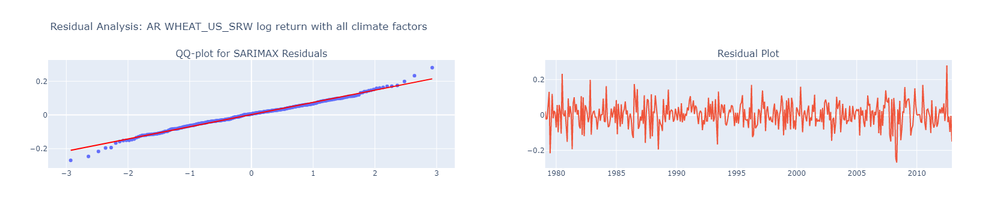

In [659]:
# create residual plot
sar_hrw_res_fig = sp.make_subplots(rows=1, cols=2, 
                                   subplot_titles=("QQ-plot for SARIMAX Residuals", "Residual Plot"))

sar_hrw_res_fig.add_trace(go.Scatter(x=srw_qq_x, y=srw_qq_y, mode="markers", 
                                        name="Residuals", marker=dict(size=6)), 
                             row=1, col=1)
sar_hrw_res_fig.add_trace(go.Scatter(x=srw_res_x, y=srw_res_y, 
                                           mode="lines", name="Residuals"), 
                              row=1, col=2)

# fit an simple regression line for normality check
srw_slope, srw_intercept = np.polyfit(srw_qq_x, srw_qq_y, 1)
srw_qq_line = srw_slope * srw_qq_x + srw_intercept

sar_hrw_res_fig.add_trace(go.Scatter(x=srw_qq_x, y=srw_qq_line, mode="lines", 
                         name="Fitted Line", line=dict(color="red")), 
              row=1, col=1)

sar_hrw_res_fig.update_layout(
    title="Residual Analysis: AR WHEAT_US_SRW log return with all climate factors",
    showlegend=False,
)

# display the plot
sar_hrw_res_fig.show()

In [660]:
# calculate RMAE
mean_absolute_error(ar_model8_inference, dataset['log_SRW'].loc[ar_model8_inference.index]), np.sqrt(mean_absolute_error(ar_model8_inference, dataset['log_SRW'].loc[ar_model8_inference.index]))

(0.0559400876026951, 0.23651656940412252)

## LOG_WHEAT_UR_HRW

In [455]:
# construct the model
order = (8, 1, 1)
seasonal_order = (2, 2, 3, 12)
ar_model9 = SARIMAX(endog=mei_dataset1['log_HRW'],
                    exog=mei_dataset1[exog_columns],
                    order=order, seasonal_order=seasonal_order, freq='MS',
                    enforce_stationarity=False, enforce_invertibility=False).fit(maxiter=1000, method='powell')

ar_model9.summary()

Optimization terminated successfully.
         Current function value: -1.130818
         Iterations: 15
         Function evaluations: 3569


<class 'statsmodels.iolib.summary.Summary'>
"""
                                         SARIMAX Results                                          
==================================================================================================
Dep. Variable:                                    log_HRW   No. Observations:                  408
Model:             SARIMAX(8, 1, 1)x(2, 2, [1, 2, 3], 12)   Log Likelihood                 461.374
Date:                                    Wed, 03 May 2023   AIC                           -872.748
Time:                                            11:21:23   BIC                           -776.659
Sample:                                        01-01-1979   HQIC                          -834.481
                                             - 12-01-2012                                         
Covariance Type:                                      opg                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
ao_index           0.0069      0.008      0.904      0.366      -0.008       0.022
iod_index       2.412e-05      0.005      0.005      0.996      -0.009       0.009
nhtele_index_1     0.0047      0.013      0.369      0.712      -0.020       0.029
nhtele_index_2     0.0043      0.015      0.295      0.768      -0.024       0.033
nhtele_index_3     0.0068      0.011      0.615      0.539      -0.015       0.029
nhtele_index_4     0.0084      0.009      0.947      0.344      -0.009       0.026
pna_index          0.0018      0.006      0.290      0.772      -0.010       0.014
psa_index_1       -0.0038      0.006     -0.645      0.519      -0.016       0.008
psa_index_2        0.0052      0.008      0.667      0.505      -0.010       0.020
sam_index          0.0029      0.004      0.745      0.457      -0.005       0.011
ar.L1              0.2323      0.054      4.268      0.000       0.126       0.339
ar.L2             -0.0627      0.053     -1.186      0.236      -0.166       0.041
ar.L3              0.0644      0.056      1.149      0.250      -0.045       0.174
ar.L4              0.0345      0.060      0.571      0.568      -0.084       0.153
ar.L5              0.0436      0.057      0.766      0.443      -0.068       0.155
ar.L6             -0.0485      0.063     -0.772      0.440      -0.172       0.075
ar.L7             -0.0899      0.064     -1.395      0.163      -0.216       0.036
ar.L8             -0.0402      0.056     -0.716      0.474      -0.150       0.070
ma.L1             -0.9993      0.455     -2.197      0.028      -1.891      -0.108
ar.S.L12          -0.7473      0.311     -2.404      0.016      -1.357      -0.138
ar.S.L24          -0.1886      0.068     -2.781      0.005      -0.321      -0.056
ma.S.L12          -1.2425      0.323     -3.841      0.000      -1.877      -0.608
ma.S.L24          -0.2185      0.616     -0.355      0.723      -1.426       0.989
ma.S.L36           0.4995      0.308      1.620      0.105      -0.105       1.104
sigma2             0.0034      0.002      2.191      0.028       0.000       0.006
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                60.31
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               3.21   Skew:                             0.37
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.91
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [481]:
# generate inference result
ar_model9_inference = ar_model9.predict(start='2013-01-01', end='2018-12-01', exog=dataset[exog_columns].loc['2013-01-01':'2018-12-01'])

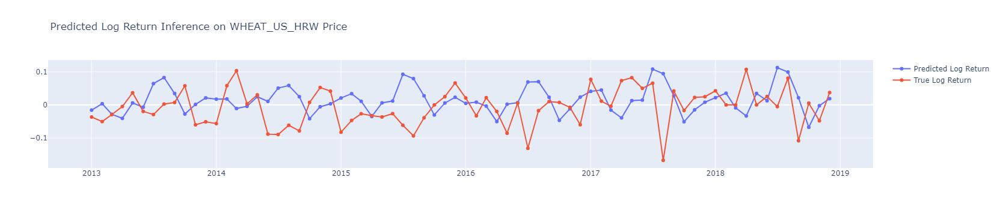

In [482]:
# result visualisation
sar_hrw_fig = go.Figure()

sar_hrw_fig.add_trace(go.Scatter(y=ar_model9_inference,
                                 x=ar_model9_inference.index,
                                 mode='lines+markers', name="Predicted Log Return"))
sar_hrw_fig.add_trace(go.Scatter(y=dataset['log_HRW'].loc[ar_model9_inference.index],
                                 x=ar_model9_inference.index,
                                 mode='lines+markers', name="True Log Return"))

sar_hrw_fig.update_layout(title="Predicted Log Return Inference on WHEAT_US_HRW Price")

sar_hrw_fig.show()

In [531]:
# create qq-plot and residual plot
hrw_residuals = ar_model9.resid.dropna()
hrw_res_x, hrw_res_y = hrw_residuals.index, hrw_residuals.values

hrw_qq_x, hrw_qq_y = probplot(hrw_residuals, fit=True)[0]

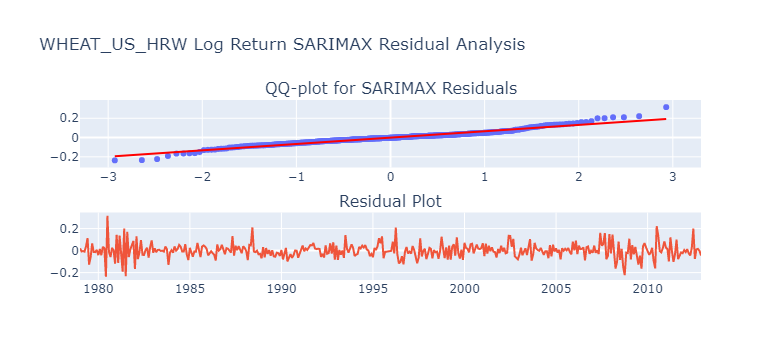

In [546]:
# create residual plot
sar_hrw_res_fig = sp.make_subplots(rows=2, cols=1, 
                                   subplot_titles=("QQ-plot for SARIMAX Residuals", "Residual Plot"))

sar_hrw_res_fig.add_trace(go.Scatter(x=hrw_qq_x, y=hrw_qq_y, mode="markers", 
                                        name="Residuals", marker=dict(size=6)), 
                             row=1, col=1)
sar_hrw_res_fig.add_trace(go.Scatter(x=hrw_res_x, y=hrw_residuals, 
                                           mode="lines", name="Residuals"), 
                              row=2, col=1)

# fit an simple regression line for normality check
hrw_slope, hrw_intercept = np.polyfit(hrw_qq_x, hrw_qq_y, 1)
hrw_qq_line = hrw_slope * hrw_qq_x + hrw_intercept

sar_hrw_res_fig.add_trace(go.Scatter(x=hrw_qq_x, y=hrw_qq_line, mode="lines", 
                         name="Fitted Line", line=dict(color="red")), 
              row=1, col=1)

sar_hrw_res_fig.update_layout(
    title="WHEAT_US_HRW Log Return SARIMAX Residual Analysis",
    showlegend=False,
)

# display the plot
sar_hrw_res_fig.show()

In [494]:
# calculate RMAE
np.sqrt(mean_absolute_error(ar_model9_inference, dataset['log_SRW'].loc[ar_model9_inference.index]))

0.23774078613362842

## LOG_WHEAT_CANADI

In [458]:
# construct the model
order = (8, 1, 1)
seasonal_order = (1, 2, 3, 12)
ar_model10 = SARIMAX(endog=mei_dataset1['log_CANADI'],
                    exog=mei_dataset1[exog_columns],
                    order=order, seasonal_order=seasonal_order, freq='MS',
                    enforce_stationarity=False, enforce_invertibility=False).fit(maxiter=1000, method='powell')

ar_model10.summary()

Optimization terminated successfully.
         Current function value: -1.148377
         Iterations: 16
         Function evaluations: 3798


<class 'statsmodels.iolib.summary.Summary'>
"""
                                         SARIMAX Results                                          
==================================================================================================
Dep. Variable:                                 log_CANADI   No. Observations:                  408
Model:             SARIMAX(8, 1, 1)x(1, 2, [1, 2, 3], 12)   Log Likelihood                 468.538
Date:                                    Wed, 03 May 2023   AIC                           -889.075
Time:                                            11:22:41   BIC                           -796.830
Sample:                                        01-01-1979   HQIC                          -852.339
                                             - 12-01-2012                                         
Covariance Type:                                      opg                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
ao_index           0.0024      0.008      0.308      0.758      -0.013       0.018
iod_index         -0.0012      0.005     -0.264      0.792      -0.010       0.008
nhtele_index_1     0.0002      0.012      0.017      0.986      -0.023       0.024
nhtele_index_2     0.0026      0.014      0.181      0.856      -0.025       0.031
nhtele_index_3     0.0050      0.012      0.431      0.666      -0.018       0.028
nhtele_index_4     0.0077      0.009      0.876      0.381      -0.010       0.025
pna_index         -0.0005      0.006     -0.078      0.938      -0.012       0.011
psa_index_1       -0.0085      0.005     -1.609      0.108      -0.019       0.002
psa_index_2        0.0075      0.007      1.084      0.278      -0.006       0.021
sam_index          0.0012      0.004      0.342      0.732      -0.006       0.008
ar.L1              0.2675      0.045      5.908      0.000       0.179       0.356
ar.L2              0.1625      0.055      2.978      0.003       0.056       0.269
ar.L3             -0.0983      0.058     -1.705      0.088      -0.211       0.015
ar.L4             -0.0343      0.060     -0.570      0.569      -0.152       0.084
ar.L5              0.1121      0.063      1.776      0.076      -0.012       0.236
ar.L6              0.0090      0.063      0.143      0.887      -0.115       0.133
ar.L7             -0.1342      0.061     -2.185      0.029      -0.255      -0.014
ar.L8             -0.0229      0.055     -0.416      0.677      -0.131       0.085
ma.L1             -1.0001      3.522     -0.284      0.776      -7.903       5.903
ar.S.L12          -0.5200      0.361     -1.440      0.150      -1.228       0.188
ma.S.L12          -1.5348      1.449     -1.059      0.290      -4.376       1.306
ma.S.L24           0.0991      1.019      0.097      0.923      -1.898       2.096
ma.S.L36           0.4568      0.804      0.568      0.570      -1.119       2.033
sigma2             0.0027      0.010      0.281      0.779      -0.016       0.022
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               241.37
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.74   Skew:                             0.38
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [459]:
# generate inference result
ar_model10_inference = ar_model10.predict(start='2013-01-01', end='2018-12-01', exog=dataset[exog_columns].loc['2013-01-01':'2018-12-01'])

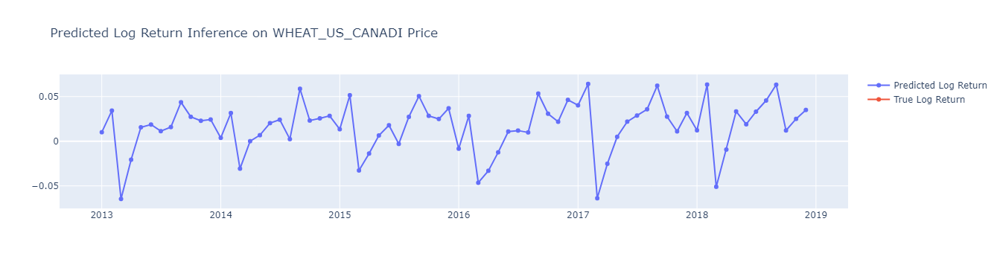

In [479]:
# result visualisation
sar_canadi_fig = go.Figure()

sar_canadi_fig.add_trace(go.Scatter(y=ar_model10_inference,
                                 x=ar_model10_inference.index,
                                 mode='lines+markers', name="Predicted Log Return"))
sar_canadi_fig.add_trace(go.Scatter(y=dataset['log_CANADI'].loc[ar_model10_inference.index],
                                 x=ar_model10_inference.index,
                                 mode='lines+markers', name="True Log Return"))

sar_canadi_fig.update_layout(title="Predicted Log Return Inference on WHEAT_US_CANADI Price")

sar_canadi_fig.show()

In [525]:
# create qq-plot and residual plot
canadi_residuals = ar_model10.resid.dropna()
canadi_res_x, canadi_res_y = canadi_residuals.index, canadi_residuals.values

canadi_qq_x, canadi_qq_y = probplot(canadi_residuals, fit=True)[0]

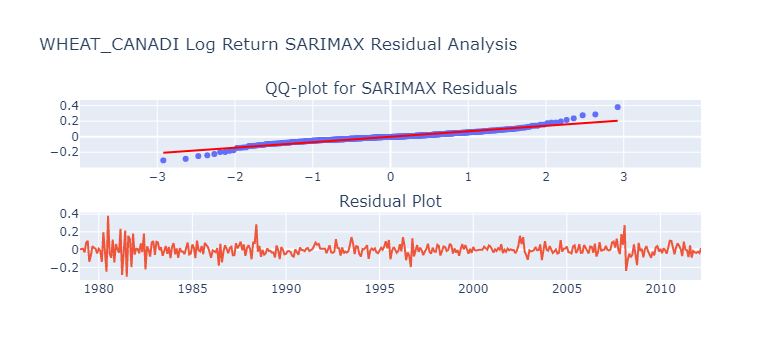

In [526]:
# create residual plot
sar_canadi_res_fig = sp.make_subplots(rows=2, cols=1, 
                                      subplot_titles=("QQ-plot for SARIMAX Residuals", "Residual Plot"))

sar_canadi_res_fig.add_trace(go.Scatter(x=canadi_qq_x, y=canadi_qq_y, mode="markers", 
                                        name="Residuals", marker=dict(size=6)), 
                             row=1, col=1)
sar_canadi_res_fig.add_trace(go.Scatter(x=canadi_res_x, y=canadi_residuals, 
                                           mode="lines", name="Residuals"), 
                              row=2, col=1)

# fit an simple regression line for normality check
canadi_slope, canadi_intercept = np.polyfit(canadi_qq_x, canadi_qq_y, 1)
canadi_qq_line = canadi_slope * canadi_qq_x + canadi_intercept

sar_canadi_res_fig.add_trace(go.Scatter(x=canadi_qq_x, y=canadi_qq_line, mode="lines", 
                         name="Fitted Line", line=dict(color="red")), 
              row=1, col=1)

sar_canadi_res_fig.update_layout(
    title="WHEAT_CANADI Log Return SARIMAX Residual Analysis",
    showlegend=False,
    # Update the aspect ratio of the subplots
    yaxis=dict(
        scaleanchor="x",
        scaleratio=1,
    ),
)

# display the plot
sar_canadi_res_fig.show()

In [496]:
# calculate RMAE
np.sqrt(mean_absolute_error(ar_model10_inference, dataset['log_SRW'].loc[ar_model10_inference.index]))

0.2219550176966364

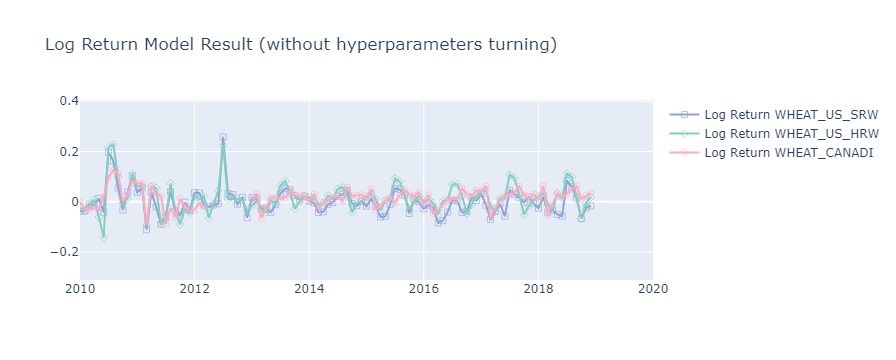

In [495]:
# summary plot
jra55_sarima_fig = go.Figure()

jra55_sarima_fig.add_trace(go.Scatter(y=pd.concat([mei_dataset1['log_SRW'], ar_model8_inference]), 
                                      x=pd.concat([mei_dataset1['log_SRW'], ar_model8_inference]).index, mode="lines+markers",
                                      name='Log Return WHEAT_US_SRW', marker=dict(opacity=0.6, symbol='square-open', color='#8FA2DC')))
jra55_sarima_fig.add_trace(go.Scatter(y=pd.concat([mei_dataset1['log_HRW'], ar_model9_inference]),
                                      x=pd.concat([mei_dataset1['log_HRW'], ar_model9_inference]).index, mode="lines+markers",
                                      name='Log Return WHEAT_US_HRW', marker=dict(opacity=0.6, symbol='diamond-open', color='#81D0BB')))
jra55_sarima_fig.add_trace(go.Scatter(y=pd.concat([mei_dataset1['log_CANADI'], ar_model10_inference]), 
                                      x=pd.concat([mei_dataset1['log_CANADI'], ar_model10_inference]).index, mode="lines+markers",
                                      name='Log Return WHEAT_CANADI', marker=dict(opacity=0.6, symbol='circle-open', color='#FEAAC2')))

jra55_sarima_fig.update_layout(title="Log Return Model Result (without hyperparameters turning)")
jra55_sarima_fig.update_xaxes(range=['2010-01-01', '2020-01-01'])

jra55_sarima_fig.show()

During constructing the base AR model, we notice few points:
- Initial value for order and seasonal_order is crucial, default values or extremly bigger value will decrease the model performance and increase the model training time with no guarantee to produce a better result.
- Log retun looks relatively reasonable in the above graph
- This brings a contradiction with finding in notebook AR_JRA55.ipynb, in there, we see all factors does generate a reasonable result when predicing WHEAT_CANADI log return. However, in AR_JRA55 we see that there is an extremly poor performance in WHEAT_CANADI price prediction.

# Summary

In this study, we aim to develop a baseline Auto Regressive (AR) model for forecasting future World Bank commodity prices. Our current results indicate that incorporating the MEI factor alone does not significantly improve the AR model's performance in predicting prices for WHEAT_US_SRW and WHEAT_US_HRW. However, for WHEAT_CANADI, the MEI factor seems to offer a slight improvement over the baseline model, as the observed price fluctuations align with the ENSO pattern, occurring approximately every 3-7 years.

In beginning, we try to build two models two see the MEI factor effects. According to the residual plots, both model residuals follow a normal distribution. However, the model prediction shows a significant deviation from the true value, which doesn't provide a good inference.

When attempting to include additional factors in the model, we acknowledge the challenges arising from the uncertainty of interactions between these factors and the potential presence of nonlinear relationships among them. Despite these complexities, our model with appropriately chosen hyperparameters has managed to produce relatively reasonable log return predictions, demonstrating an expected cyclical pattern. The RMAE values for the WHEAT_SRW, WHEAT_HRW, and WHEAT_CANADI models are 0.2365, 0.2377, and 0.2220, respectively, which suggests similar performance across all three models.

Considering the scale of the data, these RMAE values indicate relatively reasonable performance for the models. An RMAE value closer to 0 would imply better model accuracy, while a value closer to 1 would suggest larger prediction errors. In this context, the obtained RMAE values (around 0.23) suggest that the models are providing relatively reasonable and accurate predictions as the errors are relatively small compared to the full range of possible values. In addition, residuals of three SARIMAX model and residual plots shows residuals are stay in a acceptable range with an normal distribution.

Based on these findings, we can conclude that the SARIMA model provides a reasonable time series prediction for commodity prices. While we cannot claim that SARIMA is the best model for all commodity price forecasts, it serves as a suitable baseline for future model development.

Future work may include but not limit:
- Refining the model by utilizing tools such as the Augmented Dickey-Fuller test (adfuller), as well as ACF and PACF plots.
- Investigating the interactions between JRA55 dataset factors to enhance the baseline model.
    - Granger Causality
- Exploring and deploying alternative models to address the large-scale and multi-dimensional nature of climate-related problems, including:
    - Dynamic Bayesian Networks
    - Long Short-Term Memory (LSTM) networks
    - Other potential models

# Limitations
- Limited data 
- Filling missing value use interpolation may not suitable for data entry after 2008 due to economic crisis effect and inflation
- Consider incorporate with Consumer Price Indice for more information
- Trends in Atmospheric Carbon Dioxide (CO2) data use the global average data, however we have data specifically for US and Canada. Regional CO2 data may improve the model performance.